In [38]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [39]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Length'] < 2000000]
data = data.dropna()#.describe()
data['Length'] = data['End'] - data['Start']
data

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,4,179699.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,114999.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,3,178199.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,7399.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,1,242099.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,1,526799.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,1,1320099.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,61599.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,3199.0


In [40]:
data['Length'].describe()

count    2.199340e+05
mean     3.639361e+05
std      4.761110e+05
min      9.990000e+02
25%      3.069900e+04
50%      1.615990e+05
75%      5.291990e+05
max      1.835699e+06
Name: Length, dtype: float64

In [41]:
## input for CNVRanger 
data = pd.read_csv("../data/cnvnator_cnvs.csv")
cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
cnvranger['CNV_Value'] = cnvranger['CNV_Value'] * 2 
cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)
cnvranger

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/2048941814.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cnvranger['CNV_Value'] = cnvranger['CNV_Value'] * 2
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/2048941814.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)


,Sample_ID,Chr,Start,End,CNV_Value
0,LP6005441-DNA_A01,1,231001,237900,4
1,LP6005441-DNA_A01,1,471201,551200,0
2,LP6005441-DNA_A01,1,723801,728100,3
3,LP6005441-DNA_A01,1,1010901,1014200,0
4,LP6005441-DNA_A01,1,4124201,4127700,1
...,...,...,...,...,...
229336,SS6004480,X,153459601,153466400,3
229337,SS6004480,X,153474401,153496200,3
229338,SS6004480,X,153498901,153518500,3
229339,SS6004480,X,154798801,154804000,0


In [42]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data = data.dropna()#.describe()
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,4,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,3,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,1,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,1,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,1,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


In [43]:
deletions = distribution[distribution['CNV_Value'] < 2]
deletions['type'] = 'Deletion'
duplications = distribution[distribution['CNV_Value'] > 2]
duplications['type'] = 'Duplication'

distribution = pd.concat([deletions,duplications])

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/486697102.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['type'] = 'Deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/486697102.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['type'] = 'Duplication'


In [44]:
## Filter by chromosomes
data_x = distribution[distribution.Chr == 'X']
data_no_sex_chr = distribution[distribution.Chr != 'Y']
data_no_sex_chr = data_no_sex_chr[data_no_sex_chr.Chr != 'X']

#data = data[data['GAUSSIAN-EVAL'] < 0.05]
distribution 

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,type
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0,Deletion
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0,Deletion
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,1,3500.0,Deletion
5,1,13219701.0,13781900.0,CNVR_39,LP6005441-DNA_A01,13472301,13657600,0,185300.0,Deletion
6,1,13219701.0,13781900.0,CNVR_39,LP6005441-DNA_A01,13698701,13773800,0,75100.0,Deletion
...,...,...,...,...,...,...,...,...,...,...
229335,X,NaN,NaN,NaN,SS6004480,152654701,152657400,3,2700.0,Duplication
229336,X,NaN,NaN,NaN,SS6004480,153459601,153466400,3,6800.0,Duplication
229337,X,NaN,NaN,NaN,SS6004480,153474401,153496200,3,21800.0,Duplication
229338,X,NaN,NaN,NaN,SS6004480,153498901,153518500,3,19600.0,Duplication


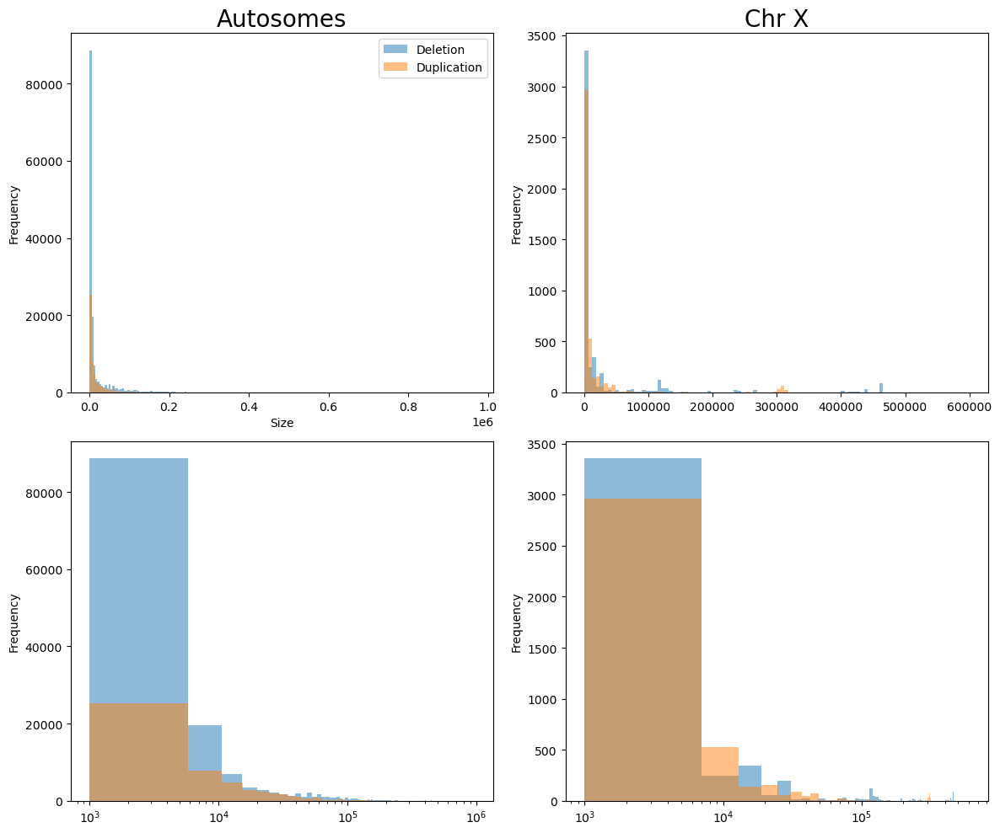

In [45]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['type'])['Length']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['type'])['Length']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['type'])['Length']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['type'])['Length']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

In [46]:
## ADDING DUPLICATION/DELETION COLUMN 

#deletions = data[data['RD'] < 2 ] 
##deletions['Type'] = 'deletion'
#duplications= data[data['RD'] > 2] 
#duplications['Type'] = 'duplication'

#frames = [deletions,duplications]

#data = pd.concat(frames)
#data


In [47]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv = cnv.fillna(2)
cnv['Chromosome'] = 'chr' + cnv['Chromosome'].astype(str)
cnv['Start'] = cnv['Start'].astype(int)
cnv['End'] = cnv['Start'].astype(int)
cnv.to_csv('../data/grch37_cnvr_cnv_values.csv', index=False)
coordinates = cnv.iloc[:,0:3]
coordinates.to_csv('../data/grch37_cnvr_coordinates.bed', sep='\t', header=False, index=False)
cnv

Sample_ID,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,chr1,176101,176101,4.0,2.0,2.0,3.0,3.0,2.333333,3.0,...,3.0,1.0,3.0,1.000000,2.666667,4.0,1.666667,2.0,3.0,3.0
1,chr1,449901,449901,0.0,1.5,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0
2,chr1,665601,665601,3.0,4.0,2.0,2.0,2.0,2.000000,2.0,...,4.0,3.0,4.5,3.333333,3.666667,3.0,4.000000,4.5,2.0,2.0
3,chr1,891701,891701,2.0,2.0,2.0,2.0,2.0,2.000000,2.0,...,0.0,0.0,2.0,2.000000,2.000000,0.0,2.000000,0.0,0.0,0.0
4,chr1,1007801,1007801,0.0,2.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,2.000000,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,chr9,140136301,140136301,2.0,2.0,2.0,2.0,2.0,2.000000,2.0,...,2.0,2.0,2.0,2.000000,2.000000,2.0,2.000000,2.0,2.0,2.0
7776,chr9,140197201,140197201,2.0,2.0,2.0,2.0,2.0,2.000000,2.0,...,3.0,2.0,2.0,2.000000,2.000000,2.0,2.000000,2.0,2.0,2.0
7777,chr9,140245301,140245301,0.0,1.0,0.0,0.0,1.0,2.000000,0.0,...,2.0,0.0,2.0,1.000000,1.000000,0.0,2.000000,2.0,0.0,0.0
7778,chr9,140387601,140387601,2.0,2.0,2.0,2.0,2.0,2.000000,2.0,...,2.5,4.0,2.0,4.000000,2.000000,4.0,2.000000,4.0,2.0,2.0


In [48]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.000000,1.5,4.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A04,2.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A05,3.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A06,3.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A08,2.333333,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,4.000000,0.0,3.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,...,0.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,4.0,2.0
SS6004477,1.666667,0.0,4.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.000000,0.0,4.5,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,4.0,2.0


In [49]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
LP6005443-DNA_B06,F,WestEurasia,Iceland,1.500000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,3.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.000000,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,3.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_G11,M,Africa,SierraLeone,3.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,1.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,2.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_A06,M,EastAsia,Myanmar,2.000000,0.0,2.0,2.0,1.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_B06,M,EastAsia,Myanmar,2.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,1.0,2.0,0.0,2.0,2.0
LP6005441-DNA_B08,F,Africa,Congo,2.666667,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [50]:
anotation['10-Region'].unique()


array(['WestEurasia', 'SouthAsia', 'Africa', 'CentralAsiaSiberia',
       'Oceania', 'America', 'EastAsia'], dtype=object)

In [51]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    

for j in dt_groupped:
    j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/475731320.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/475731320.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30297/475731320.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyd

In [52]:
dt_groupped

[                       0     1         2     3     4     5     6     7     \
 LP6005442-DNA_G11  3.333333   0.0  2.000000   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_H11  4.000000   0.0  2.000000   2.0   2.0   2.0   2.0   2.0   
 LP6005443-DNA_G08  2.666667   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005441-DNA_B11  3.000000   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005441-DNA_A11  3.000000   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005443-DNA_H08  4.000000   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005443-DNA_B09  3.000000   0.0  2.000000   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_D09  3.000000   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005441-DNA_F01  2.000000   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005443-DNA_E02  2.333333   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005441-DNA_A08  2.333333   0.0  2.000000   2.0   0.0   2.0   2.0   2.0   
 LP6005592-DNA_C03  2.500000   0.0  2.500000   2.0   0.0   2.0  

In [53]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
Africa-America,0.004630,NaN,0.014737,0.001639,0.025654,0.001316,NaN,NaN,NaN,NaN,...,0.004323,0.000000e+00,NaN,0.007692,-6.396999e-16,0.007692,0.007692,0.242718,0.017420,NaN
Africa-CentralAsiaSiberia,0.015446,0.023280,0.028582,0.004956,0.000424,0.035011,NaN,NaN,NaN,NaN,...,0.024985,2.840813e-02,NaN,0.008766,1.778656e-02,0.001763,0.008766,0.209197,0.013107,NaN
Africa-EastAsia,0.004370,0.010747,0.009661,0.000876,0.005281,0.014054,NaN,NaN,NaN,NaN,...,0.008887,9.327668e-03,NaN,0.011747,4.361456e-03,0.029680,0.011747,0.437200,0.027842,NaN
Africa-Oceania,0.068536,0.027363,0.040874,0.000770,0.007135,0.000306,NaN,NaN,0.027363,NaN,...,0.001161,1.535241e-02,NaN,0.008141,7.770008e-05,0.002870,0.008141,0.246038,0.057945,NaN
Africa-SouthAsia,0.003003,0.026760,0.010545,0.033239,0.016419,0.047915,NaN,NaN,0.013759,NaN,...,0.030691,9.332906e-03,NaN,0.010809,2.188552e-02,0.042266,0.010809,0.350192,0.016146,NaN
Africa-WestEurasia,0.005233,0.005196,0.005293,0.003879,0.006149,0.009301,NaN,NaN,0.005196,NaN,...,0.005829,1.805146e-03,NaN,0.001138,1.089664e-04,0.018330,0.014303,0.189277,0.034917,0.005196
America-CentralAsiaSiberia,0.001171,0.016975,0.003030,0.015189,0.027566,0.029931,NaN,NaN,NaN,NaN,...,0.052224,3.917379e-02,NaN,NaN,2.556818e-02,0.016975,NaN,0.003321,0.005030,NaN
America-EastAsia,0.013326,0.007138,0.001022,0.005034,0.046012,0.005763,NaN,NaN,NaN,NaN,...,0.024830,9.553977e-03,NaN,NaN,4.311894e-03,0.037957,NaN,0.040514,0.000007,NaN
America-Oceania,0.078340,0.020370,0.110842,0.000180,0.068651,0.002993,NaN,NaN,0.020370,NaN,...,0.009925,2.104256e-02,NaN,NaN,8.608815e-05,0.020370,NaN,0.000079,0.013539,NaN
America-SouthAsia,0.012387,0.018363,0.003489,0.060092,0.078569,0.039938,NaN,NaN,0.009402,NaN,...,0.060092,1.024379e-02,NaN,NaN,2.954545e-02,0.044929,NaN,0.011154,0.005831,NaN


In [54]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,28,29,38,43,66,169,170,171,202,228,...,7691,7723,7731,7752,7753,7758,7762,7765,7766,7777
Africa-America,True,True,False,False,False,True,True,True,False,False,...,True,True,False,False,True,False,True,True,False,True
Africa-CentralAsiaSiberia,False,False,False,False,False,False,False,True,False,False,...,False,True,False,True,True,False,False,True,False,True
Africa-EastAsia,False,False,False,False,True,False,False,True,False,False,...,False,True,False,True,False,False,False,True,False,True
Africa-Oceania,False,False,False,False,True,False,False,True,True,False,...,False,True,True,False,False,False,False,False,True,True
Africa-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
America-CentralAsiaSiberia,False,False,True,False,False,False,False,False,False,True,...,True,False,False,False,False,False,False,False,False,False
America-EastAsia,True,False,False,False,True,False,True,False,False,True,...,False,False,False,False,True,False,True,False,False,False
America-Oceania,True,False,False,False,True,False,True,False,False,True,...,False,False,True,False,True,False,False,False,True,False
America-SouthAsia,True,False,False,False,False,True,True,False,False,True,...,True,False,False,False,True,False,True,False,False,False


In [55]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', cnv['Chromosome'])
vst_dt.insert (1, 'Start', cnv['Start'])
vst_dt.insert (2, 'End', cnv['End'])
#vst_dt.insert (3, 'Type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,chr1,176101,176101,0.00463,0.01545,0.00437,0.06854,0.00300,0.00523,0.00117,...,0.03004,0.12901,0.03077,0.02482,0.03719,0.00019,0.00015,0.04619,0.02640,0.00060
1,chr1,449901,449901,0.00000,0.02328,0.01075,0.02736,0.02676,0.00520,0.01698,...,0.00481,0.00028,0.00023,0.01463,0.00322,0.00394,0.00316,0.00001,0.01350,0.01560
2,chr1,665601,665601,0.01474,0.02858,0.00966,0.04087,0.01054,0.00529,0.00303,...,0.00572,0.15658,0.01947,0.02169,0.09015,0.00012,0.00223,0.11642,0.09313,0.00201
3,chr1,891701,891701,0.00164,0.00496,0.00088,0.00077,0.03324,0.00388,0.01519,...,0.00197,0.01172,0.04514,0.00011,0.00335,0.02864,0.00110,0.05328,0.00760,0.01774
4,chr1,1007801,1007801,0.02565,0.00042,0.00528,0.00714,0.01642,0.00615,0.02757,...,0.00815,0.01245,0.02210,0.00802,0.00016,0.00272,0.00008,0.00147,0.00001,0.00168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,chr9,140136301,140136301,0.00769,0.00176,0.02968,0.00287,0.04227,0.01833,0.01698,...,0.01586,0.00014,0.02636,0.00978,0.01292,0.00372,0.00033,0.02274,0.00804,0.00113
7776,chr9,140197201,140197201,0.00769,0.00877,0.01175,0.00814,0.01081,0.01430,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
7777,chr9,140245301,140245301,0.24272,0.20920,0.43720,0.24604,0.35019,0.18928,0.00332,...,0.06365,0.00252,0.02572,0.00140,0.04577,0.00789,0.07203,0.01352,0.00626,0.03516
7778,chr9,140387601,140387601,0.01742,0.01311,0.02784,0.05795,0.01615,0.03492,0.00503,...,0.00815,0.04592,0.00000,0.01057,0.02084,0.01009,0.00140,0.05328,0.01077,0.01359


In [56]:
vst_dt.to_csv('../data/vst_results_grch37.csv', index=False)

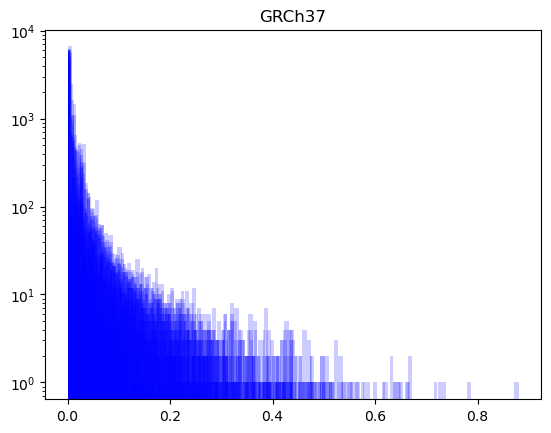

In [57]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:27].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")
    plt.title('GRCh37')

/opt/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


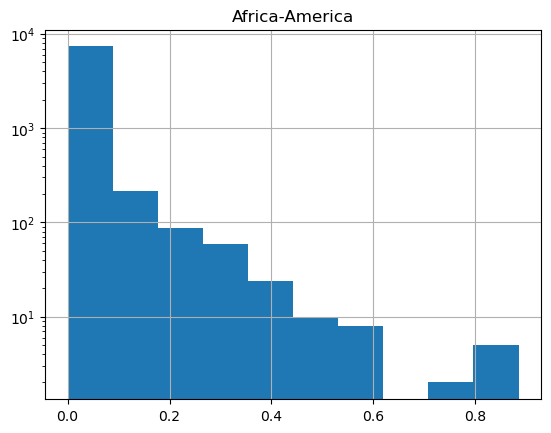

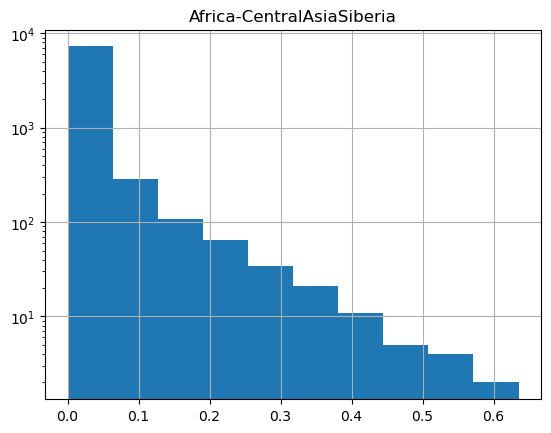

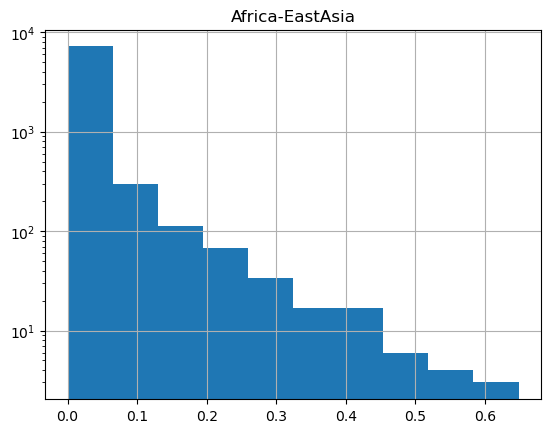

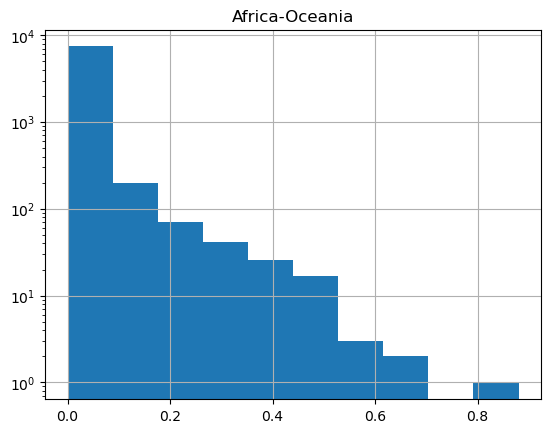

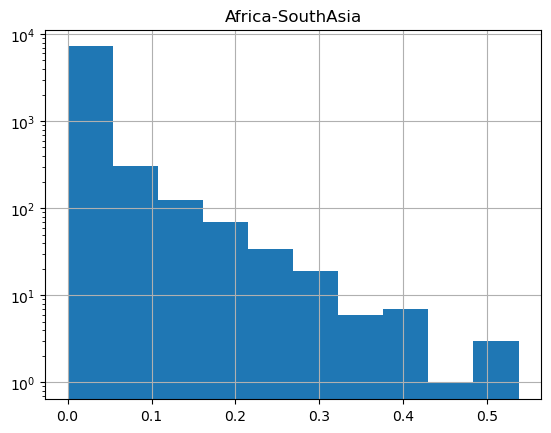

...

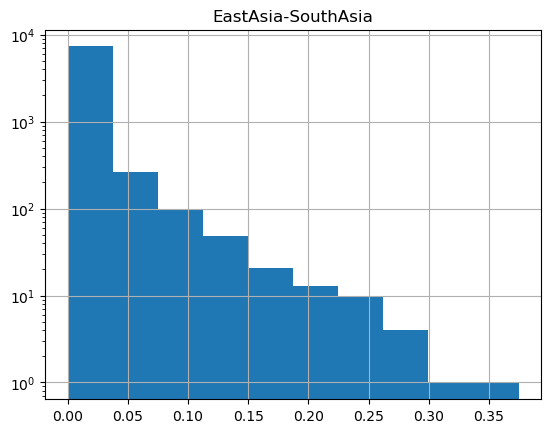

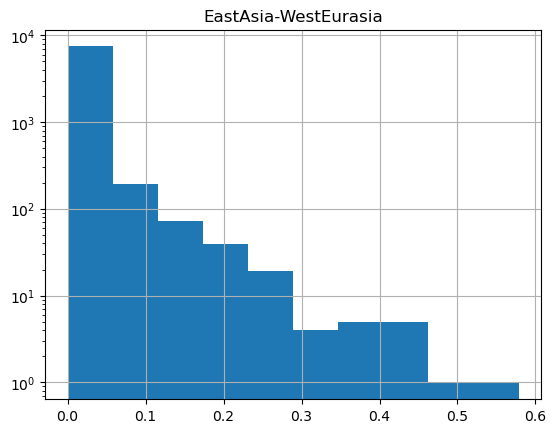

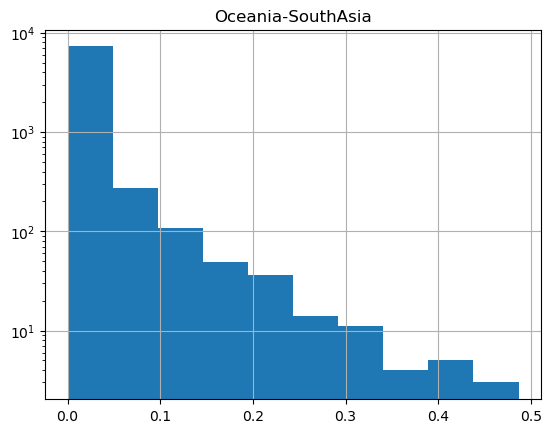

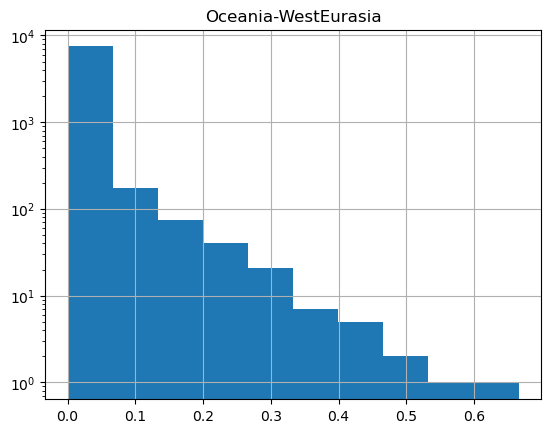

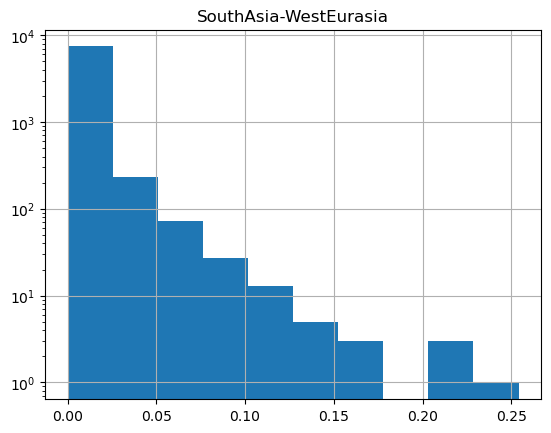

In [58]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

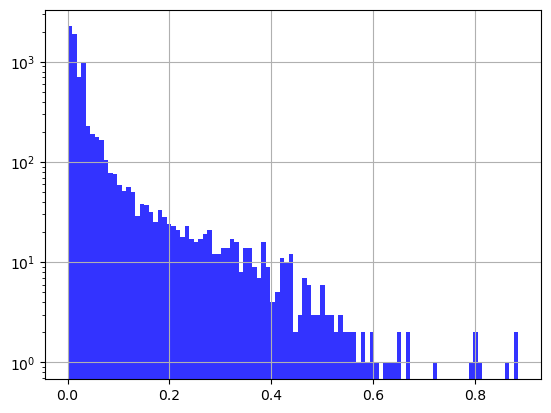

In [59]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [60]:
chr8 = vst_dt[vst_dt['Chromosome'] == '8']
chr8[chr8['Start'] > 22700000].sort_values(by='Start', ascending=True).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia


In [61]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location#[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
28,chr1,8360201,8360201,0.32161,0.19993,0.00000,0.00000,0.00000,0.00000,0.00956,...,0.20261,0.15949,0.19242,0.22741,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
29,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.00196,0.01078,0.02217,0.00500,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253
38,chr1,13219701,13219701,0.12209,0.03194,0.00035,0.01716,0.00461,0.03145,0.25941,...,0.03815,0.09418,0.06579,0.10193,0.01286,0.00234,0.02582,0.00593,0.00135,0.01395
43,chr1,16150401,16150401,0.00136,0.01265,0.02431,0.16701,0.07339,0.06031,0.02660,...,0.00097,0.28660,0.13966,0.10306,0.33966,0.18954,0.15444,0.02655,0.02565,0.00035
66,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.06285,0.38182,0.00497,0.01891,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7758,chr9,131183401,131183401,0.08988,0.07894,0.00025,0.00037,0.11241,0.33761,0.00243,...,0.07787,0.07081,0.00267,0.11757,0.00107,0.11122,0.32242,0.09506,0.30464,0.08488
7762,chr9,134074401,134074401,0.24892,0.00807,0.00186,0.06963,0.01037,0.02543,0.17743,...,0.00206,0.03050,0.02831,0.05123,0.04679,0.01793,0.03793,0.09668,0.14224,0.00107
7765,chr9,136453701,136453701,0.26558,0.21090,0.25679,0.01753,0.19511,0.06390,0.00612,...,0.00577,0.10340,0.00031,0.03493,0.13056,0.00897,0.07348,0.08675,0.01170,0.03321
7766,chr9,137097701,137097701,0.00357,0.09135,0.09335,0.42325,0.21517,0.18116,0.05796,...,0.00000,0.20208,0.03162,0.01917,0.19304,0.03398,0.02388,0.08993,0.08715,0.00077


In [62]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered.to_csv('vst_candidates_grch37.csv', index=False)
vst_dt_filtered 

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
28,chr1,8360201,8360201,0.32161,0.19993,0.00000,0.00000,0.00000,0.00000,0.00956,...,0.20261,0.15949,0.19242,0.22741,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
29,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.00196,0.01078,0.02217,0.00500,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253
38,chr1,13219701,13219701,0.12209,0.03194,0.00035,0.01716,0.00461,0.03145,0.25941,...,0.03815,0.09418,0.06579,0.10193,0.01286,0.00234,0.02582,0.00593,0.00135,0.01395
43,chr1,16150401,16150401,0.00136,0.01265,0.02431,0.16701,0.07339,0.06031,0.02660,...,0.00097,0.28660,0.13966,0.10306,0.33966,0.18954,0.15444,0.02655,0.02565,0.00035
66,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.06285,0.38182,0.00497,0.01891,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7758,chr9,131183401,131183401,0.08988,0.07894,0.00025,0.00037,0.11241,0.33761,0.00243,...,0.07787,0.07081,0.00267,0.11757,0.00107,0.11122,0.32242,0.09506,0.30464,0.08488
7762,chr9,134074401,134074401,0.24892,0.00807,0.00186,0.06963,0.01037,0.02543,0.17743,...,0.00206,0.03050,0.02831,0.05123,0.04679,0.01793,0.03793,0.09668,0.14224,0.00107
7765,chr9,136453701,136453701,0.26558,0.21090,0.25679,0.01753,0.19511,0.06390,0.00612,...,0.00577,0.10340,0.00031,0.03493,0.13056,0.00897,0.07348,0.08675,0.01170,0.03321
7766,chr9,137097701,137097701,0.00357,0.09135,0.09335,0.42325,0.21517,0.18116,0.05796,...,0.00000,0.20208,0.03162,0.01917,0.19304,0.03398,0.02388,0.08993,0.08715,0.00077


In [63]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:3].to_csv('vst_coordinates_grch37.bed', header=False, index=False,sep='\t')

In [64]:
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
28,chr1,8360201,8360201,0.32161,0.19993,0.00000,0.00000,0.00000,0.00000,0.00956,...,0.20261,0.15949,0.19242,0.22741,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
29,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.00196,0.01078,0.02217,0.00500,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253
38,chr1,13219701,13219701,0.12209,0.03194,0.00035,0.01716,0.00461,0.03145,0.25941,...,0.03815,0.09418,0.06579,0.10193,0.01286,0.00234,0.02582,0.00593,0.00135,0.01395
43,chr1,16150401,16150401,0.00136,0.01265,0.02431,0.16701,0.07339,0.06031,0.02660,...,0.00097,0.28660,0.13966,0.10306,0.33966,0.18954,0.15444,0.02655,0.02565,0.00035
66,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.06285,0.38182,0.00497,0.01891,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7758,chr9,131183401,131183401,0.08988,0.07894,0.00025,0.00037,0.11241,0.33761,0.00243,...,0.07787,0.07081,0.00267,0.11757,0.00107,0.11122,0.32242,0.09506,0.30464,0.08488
7762,chr9,134074401,134074401,0.24892,0.00807,0.00186,0.06963,0.01037,0.02543,0.17743,...,0.00206,0.03050,0.02831,0.05123,0.04679,0.01793,0.03793,0.09668,0.14224,0.00107
7765,chr9,136453701,136453701,0.26558,0.21090,0.25679,0.01753,0.19511,0.06390,0.00612,...,0.00577,0.10340,0.00031,0.03493,0.13056,0.00897,0.07348,0.08675,0.01170,0.03321
7766,chr9,137097701,137097701,0.00357,0.09135,0.09335,0.42325,0.21517,0.18116,0.05796,...,0.00000,0.20208,0.03162,0.01917,0.19304,0.03398,0.02388,0.08993,0.08715,0.00077


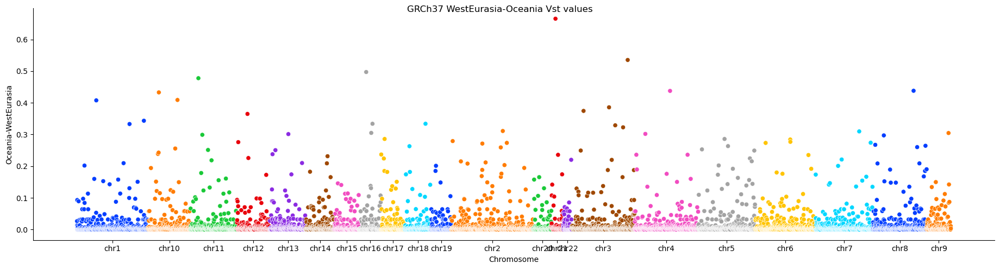

In [65]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='Oceania-WestEurasia', aspect=3.7, 
                  hue='Chromosome', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('Chromosome')['i'].median()
plot.ax.set_xlabel('Chromosome'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation 

In [66]:
from stattools.resampling import PermutationTest
PermutationTest

stattools.resampling.permutation.PermutationTest

In [67]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


Starting permutation


,7-Gender,10-Region,11-Country,28,29,38,43,66,169,170,...,7691,7723,7731,7752,7753,7758,7762,7765,7766,7777
LP6005443-DNA_B06,F,WestEurasia,Iceland,2.0,2.0,0.666667,2.0,0.0,2.0,2.0,...,2.0,2.0,0.0,2.0,2.0,0.0,2.0,1.0,1.0,0.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,2.0,2.0,0.500000,0.0,1.0,2.0,2.0,...,2.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,1.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,0.333333,1.0,2.0,2.0,2.0,...,2.0,0.0,2.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,0.500000,0.0,2.0,2.0,1.0,...,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,0.0
LP6005442-DNA_G11,M,Africa,SierraLeone,2.0,2.0,0.333333,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,1.0


In [68]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('10-Region')

dt_groupped = []
regions = features['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

,7-Gender,10-Region,11-Country,28,29,38,43,66,169,170,...,7691,7723,7731,7752,7753,7758,7762,7765,7766,7777
LP6005443-DNA_G11,M,America,Mexico,2.0,1.0,0.666667,2.0,2.0,1.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0
LP6005443-DNA_H11,F,America,Mexico,0.0,0.0,0.666667,1.0,2.0,0.0,2.0,...,0.0,2.0,2.0,1.0,1.0,0.0,2.0,0.0,0.0,2.0
SS6004479,F,America,Mexico,0.0,2.0,0.666667,2.0,2.0,1.0,2.0,...,1.0,1.0,2.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0
LP6005441-DNA_F10,F,America,Mexico,2.0,0.0,0.666667,0.0,2.0,2.0,2.0,...,1.0,2.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0
LP6005441-DNA_E10,M,America,Mexico,2.0,1.0,0.666667,1.0,2.0,0.0,0.0,...,1.0,0.0,1.5,2.0,0.0,0.0,2.0,0.0,0.0,0.0
LP6005519-DNA_D01,M,America,Argentina,0.0,2.0,0.500000,0.0,2.0,2.0,2.0,...,2.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0
SS6004476,M,America,Brazil,0.0,2.0,0.666667,0.0,2.0,1.0,2.0,...,2.0,1.0,2.0,2.0,0.0,0.0,0.0,2.0,1.5,0.0
LP6005443-DNA_E11,F,America,Mexico,2.0,2.0,0.666667,0.0,2.0,0.0,2.0,...,2.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,0.0
LP6005443-DNA_F11,F,America,Mexico,1.0,1.0,0.400000,2.0,2.0,0.0,0.0,...,2.0,2.0,2.0,1.0,1.0,2.0,0.0,2.0,2.0,0.0
LP6005677-DNA_D01,M,America,Mexico,1.0,2.0,0.000000,1.0,2.0,1.0,1.0,...,1.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0


In [69]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: RuntimeWarning: invalid value encountered in scalar divide
  vst = (vt-vs)/vt


KeyboardInterrupt: 

In [ ]:
results_permutation = pd.DataFrame(p_value_permutation).set_axis(combination_names)
results_permutation

<h2> Just CNvs that passed permutation 

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_cnvr_grch37.csv')
permutation_pased__vst_chm13

<h2> CNVs that passed permutation and vst  

In [ ]:
results_permutation = pd.read_csv('../data/permutation_passed_vst_cnvr_grch37.csv', index_col=0)
results_permutation

In [ ]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['Chromosome', 'Start','End', 'index'])
vst_dt_sb.describe()



In [ ]:
vst_dt_filtered.iloc[:,1:4]

In [ ]:
vst_dt_filtered

## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,1:4].to_csv('vst_coordinates_grch37.bed', index=False, header=False)

In [ ]:
passed_permut = (results_permutation <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut#.notnull()

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

In [ ]:
coordinates

<h1> Saving CNVs that passed permutation and Vst 

In [ ]:
cnv_passed_vst = cnv.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst.fillna(2)
cnv_passed_vst['Chromosome'] = 'chr' + cnv_passed_vst['Chromosome'].astype(str)
cnv_passed_vst['Start'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst['End'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv_passed_vst.iloc[:,0:3]
coordinates.to_csv('../data/grch37_candidates_cnvr_coordinates.bed', sep='\t', header=False, index=False)

<h1> Deletions PCA

In [70]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,28,29,38,43,66,169,170,171,202,228,...,7556,7603,7612,7645,7647,7653,7752,7753,7758,7765
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.250000,0.0,0.0,2.0,2.0,1.0,0.0,1.0,...,0.0,0.0,2.0,1.500000,0.900000,0.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,0.666667,0.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,0.0,0.000000,0.825000,0.0,2.0,1.0,0.0,2.0
LP6005441-DNA_A05,2.0,2.0,0.666667,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,0.0,0.000000,1.086957,0.0,2.0,1.0,1.0,0.0
LP6005441-DNA_A06,2.0,2.0,0.666667,2.0,2.0,2.0,2.0,2.0,0.0,1.0,...,2.0,0.0,2.0,0.800000,1.052632,1.0,1.0,2.0,0.0,2.0
LP6005441-DNA_A08,2.0,2.0,0.000000,0.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,1.500000,1.102564,2.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.666667,0.0,2.0,1.0,2.0,2.0,0.0,0.0,...,2.0,0.0,2.0,0.000000,0.593750,0.0,2.0,0.0,0.0,2.0
SS6004477,2.0,2.0,0.333333,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,0.0,1.0,1.500000,0.750000,0.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.500000,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,1.714286,1.333333,0.0,2.0,2.0,0.0,2.0


In [71]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,28,29,38,43,66,169,170,171,202,228,...,7556,7603,7612,7645,7647,7653,7752,7753,7758,7765
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.250000,0.0,0.0,2.0,2.0,1.0,0.0,1.0,...,0.0,0.0,2.0,1.500000,0.900000,0.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,0.666667,0.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,0.0,0.000000,0.825000,0.0,2.0,1.0,0.0,2.0
LP6005441-DNA_A05,2.0,2.0,0.666667,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,0.0,0.000000,1.086957,0.0,2.0,1.0,1.0,0.0
LP6005441-DNA_A06,2.0,2.0,0.666667,2.0,2.0,2.0,2.0,2.0,0.0,1.0,...,2.0,0.0,2.0,0.800000,1.052632,1.0,1.0,2.0,0.0,2.0
LP6005441-DNA_A08,2.0,2.0,0.000000,0.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,1.500000,1.102564,2.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.666667,0.0,2.0,1.0,2.0,2.0,0.0,0.0,...,2.0,0.0,2.0,0.000000,0.593750,0.0,2.0,0.0,0.0,2.0
SS6004477,2.0,2.0,0.333333,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,0.0,1.0,1.500000,0.750000,0.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.500000,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,1.714286,1.333333,0.0,2.0,2.0,0.0,2.0


In [72]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [73]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.709493,4.616401,3.311394,-0.569939,-0.434756,-1.627845,1.737256,0.474632,-0.056478,-2.761442
LP6005441-DNA_A04,F,America,Colombia,-4.139471,0.249102,-4.890480,5.525340,-1.371976,0.092969,0.034040,0.904217,-1.669635,-1.077286
LP6005441-DNA_A05,M,WestEurasia,France,-0.108159,-3.658278,0.835052,0.883131,-1.154754,0.461840,-0.773069,1.193787,-0.212266,-0.525787
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),0.288656,-3.296369,1.629714,0.121800,-0.053397,-1.432477,-1.224773,1.975189,-0.383991,1.349778
LP6005441-DNA_A08,M,Africa,Congo,9.418528,1.873549,-2.430562,-0.451640,0.814993,1.238271,1.075836,0.981076,1.172580,-0.763069
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-3.505509,-0.153816,-4.605054,6.713358,-2.116984,0.374658,0.135466,0.640416,-0.284239,-1.105981
SS6004477,M,Oceania,Australia,1.065919,6.576702,5.682091,2.226551,-0.844924,0.594230,-0.161847,0.824170,0.755519,-2.073743
SS6004478,U,Oceania,Australia,-0.925270,5.736379,4.360503,2.735894,-1.060929,0.157256,0.991212,-0.203526,0.630773,-1.649485
SS6004479,F,America,Mexico,-3.992794,0.324264,-4.696945,5.611069,1.697205,-0.212462,0.360907,1.732323,-0.549953,-0.781341


In [74]:
pca.explained_variance_ratio_

array([0.07788215, 0.05121075, 0.03894384, 0.02690506, 0.0140458 ,
       0.01202529, 0.01111902, 0.01064877, 0.01025033, 0.01015937])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.709493     4.616401     3.311394   
America            F        Colombia    -4.139471     0.249102    -4.890480   
WestEurasia        M          France    -0.108159    -3.658278     0.835052   
WestEurasia        M  Italy(Bergamo)     0.288656    -3.296369     1.629714   
Africa             M           Congo     9.418528     1.873549    -2.430562   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.505509    -0.153816    -4.605054   
Oceania            M       Australia     1.065919     6.576702     5.682091   
Oceania            U       Australia    -0.925270     5.736379     4.360503   
America            F          Mexico    -3.992794     0.324264    -4.696945   
Africa             M           Sudan     7.798048   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.709493     4.616401     3.311394   
America            F        Colombia    -4.139471     0.249102    -4.890480   
WestEurasia        M          France    -0.108159    -3.658278     0.835052   
WestEurasia        M  Italy(Bergamo)     0.288656    -3.296369     1.629714   
Africa             M           Congo     9.418528     1.873549    -2.430562   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.505509    -0.153816    -4.605054   
Oceania            M       Australia     1.065919     6.576702     5.682091   
Oceania            U       Australia    -0.925270     5.736379     4.360503   
America            F          Mexico    -3.992794     0.324264    -4.696945   
Africa             M           Sudan     7.798048   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

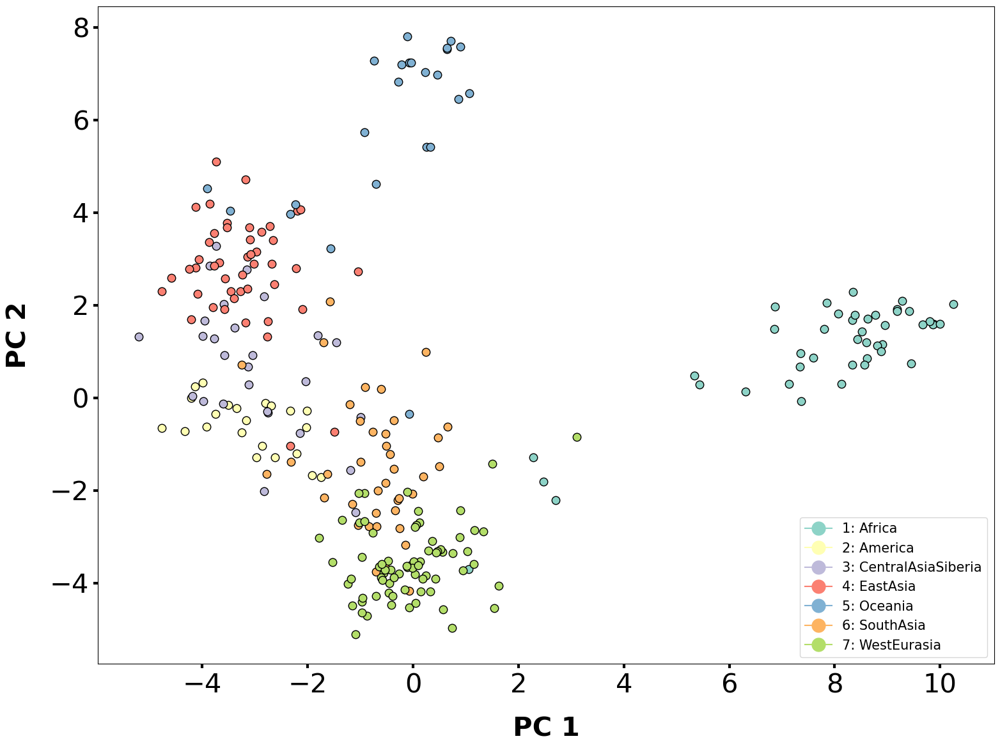

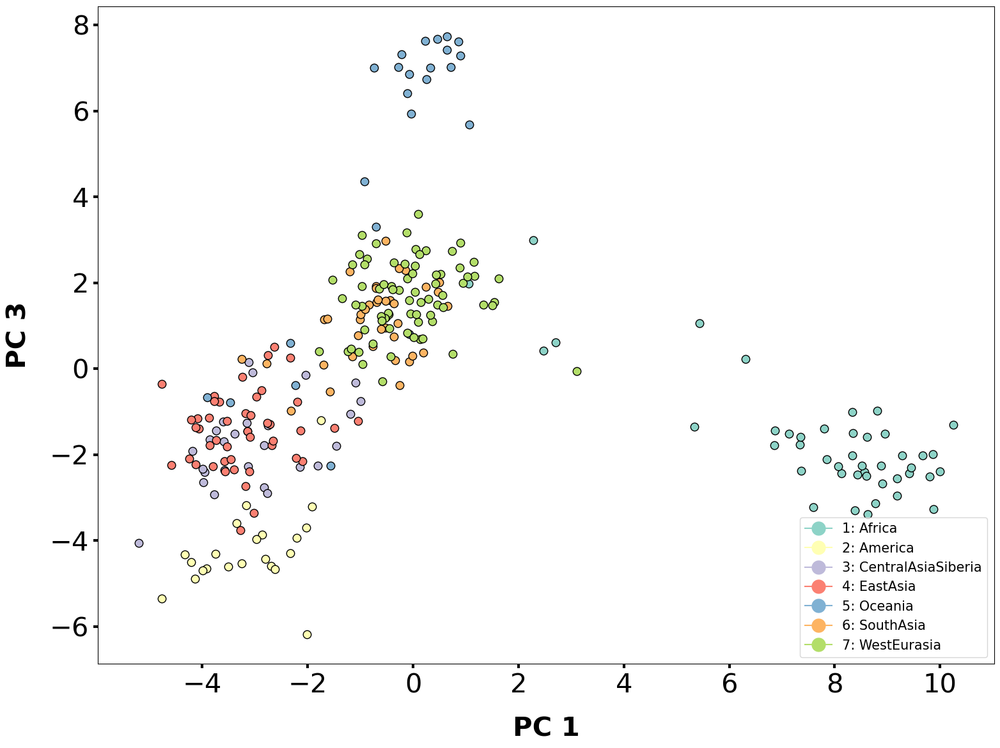

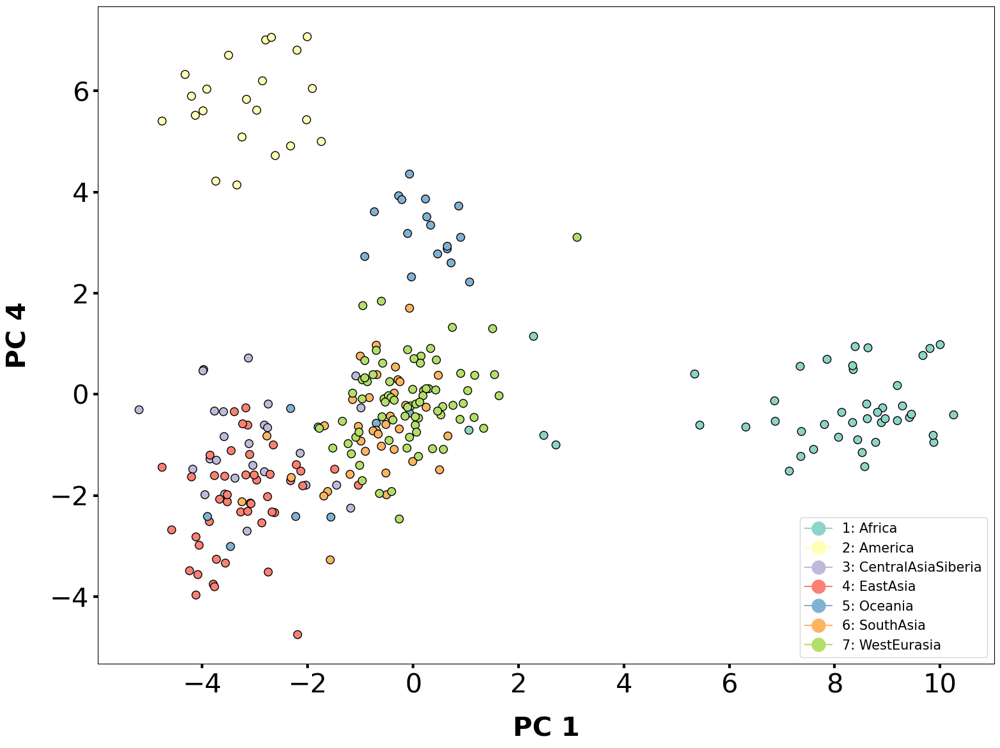

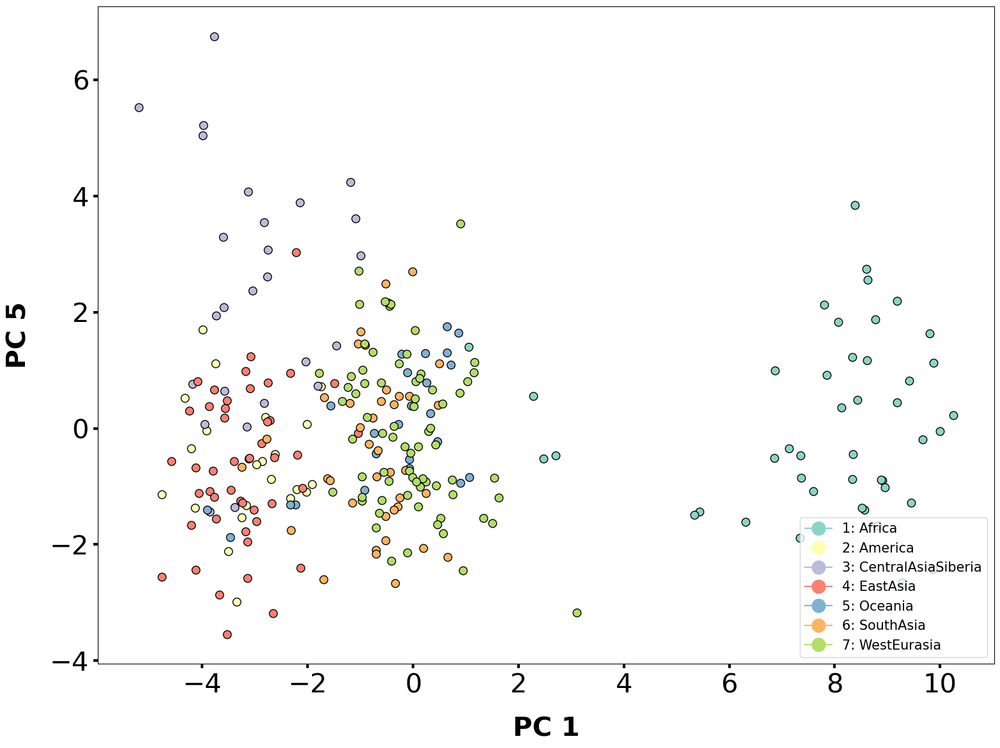

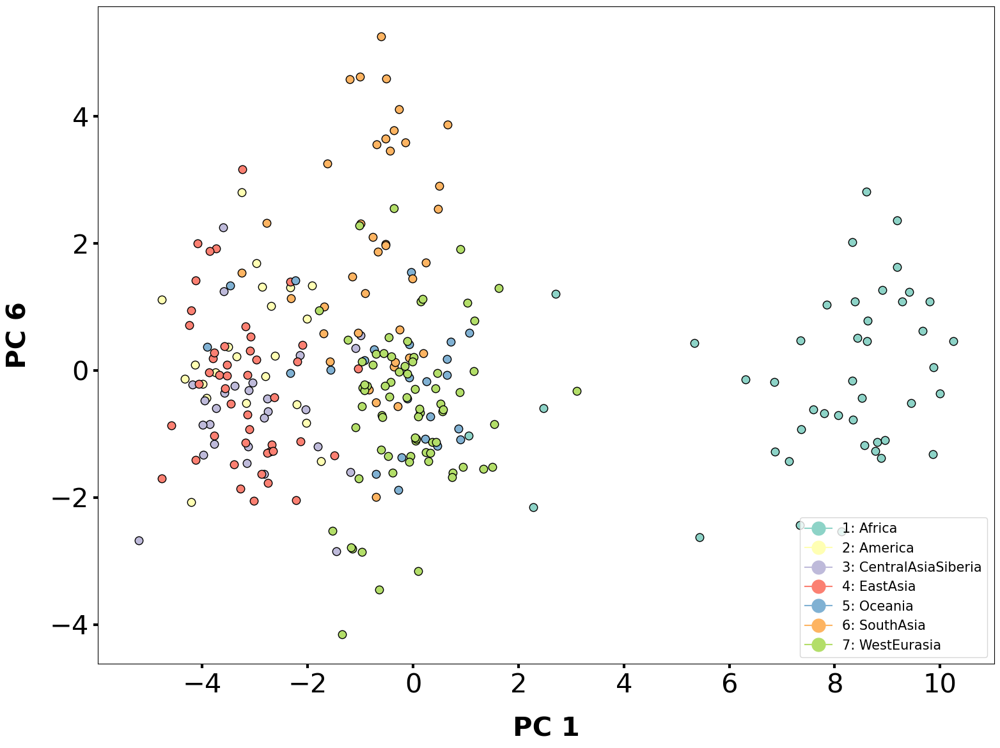

...

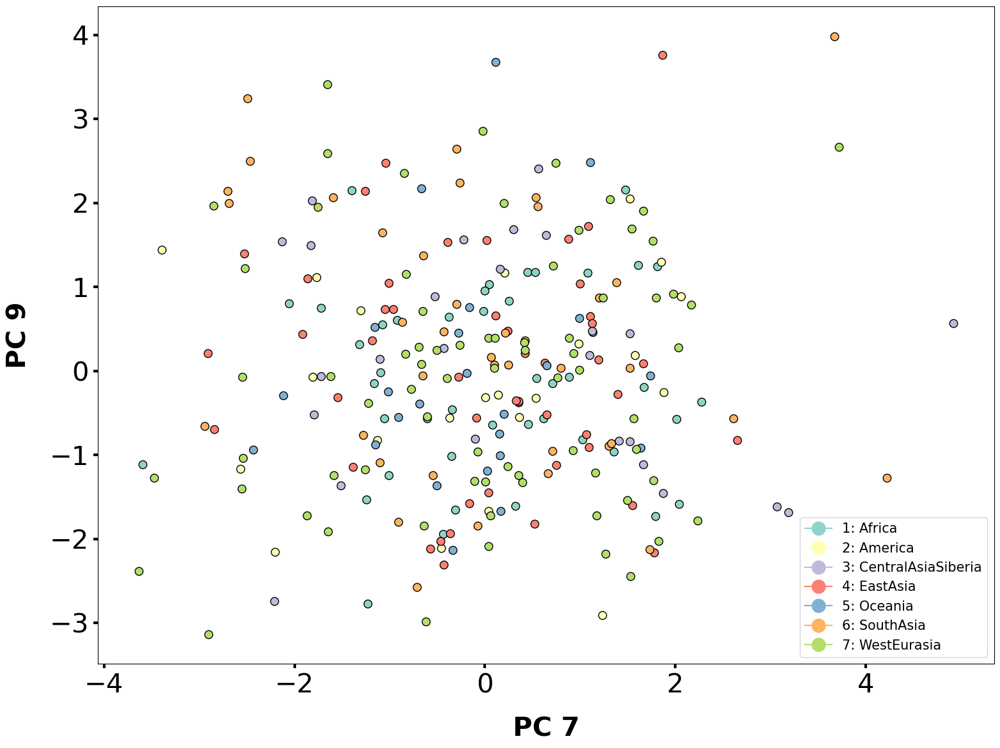

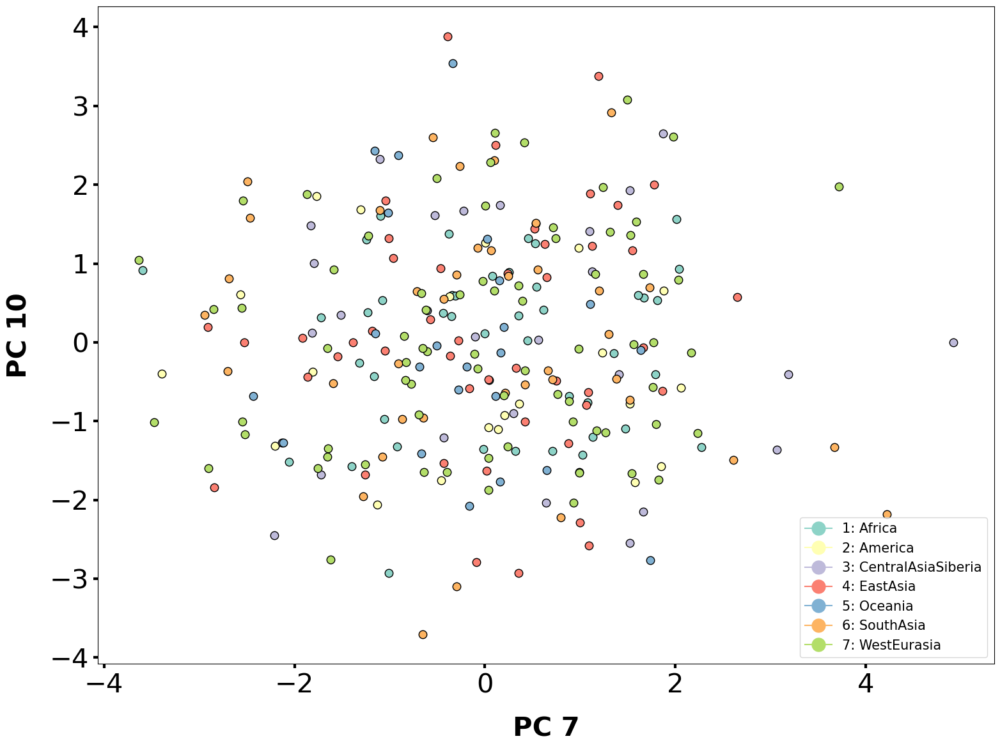

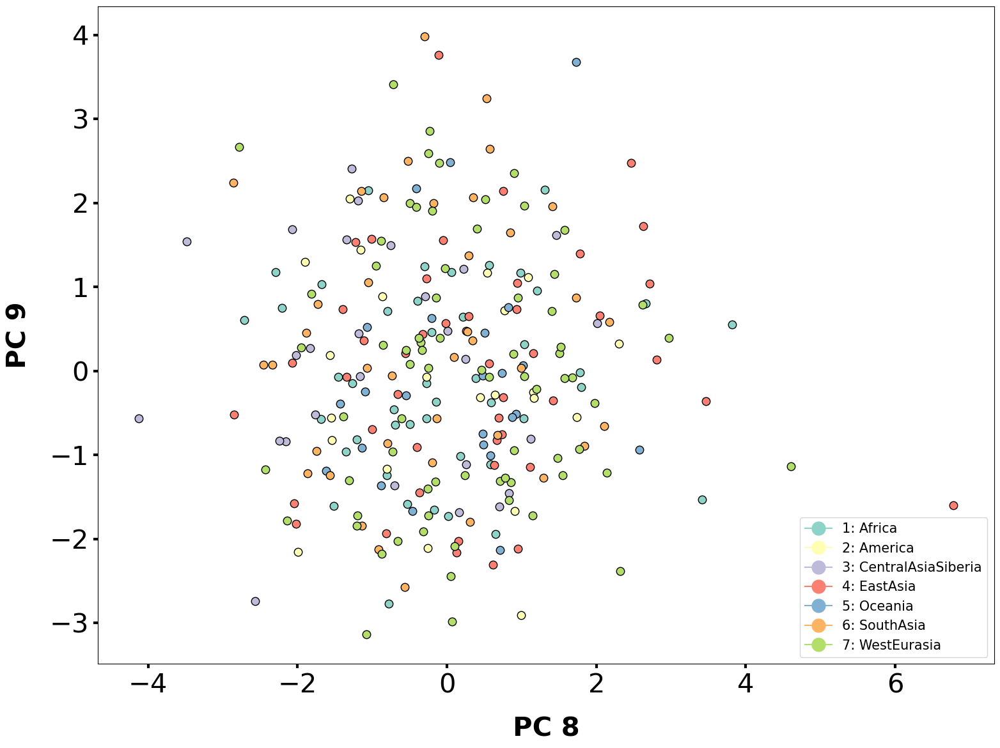

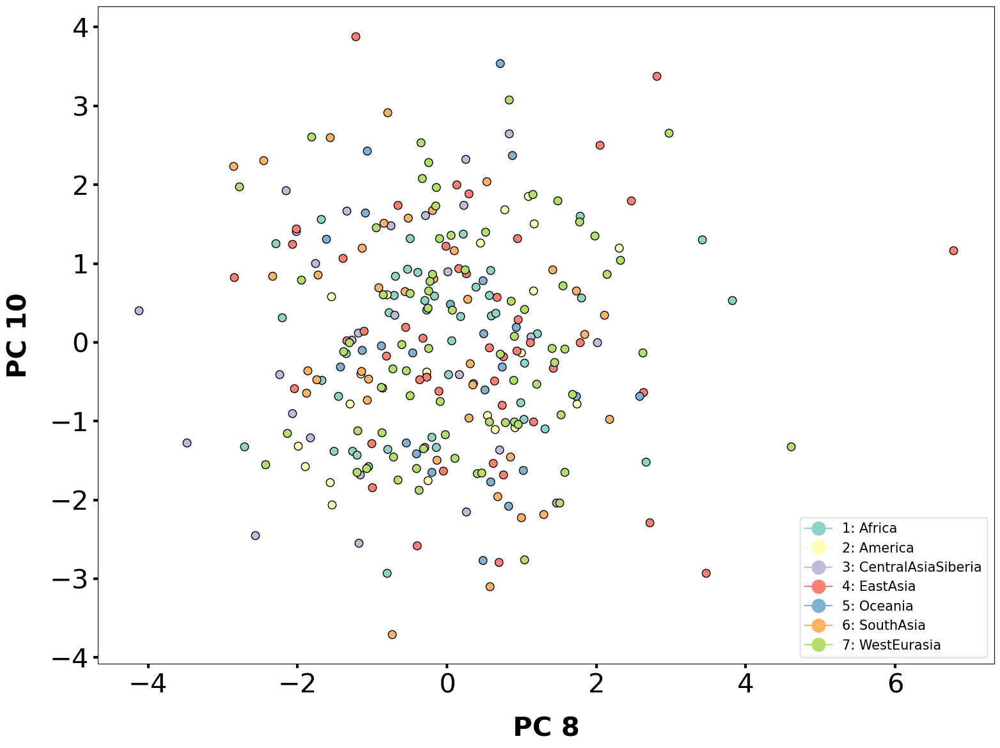

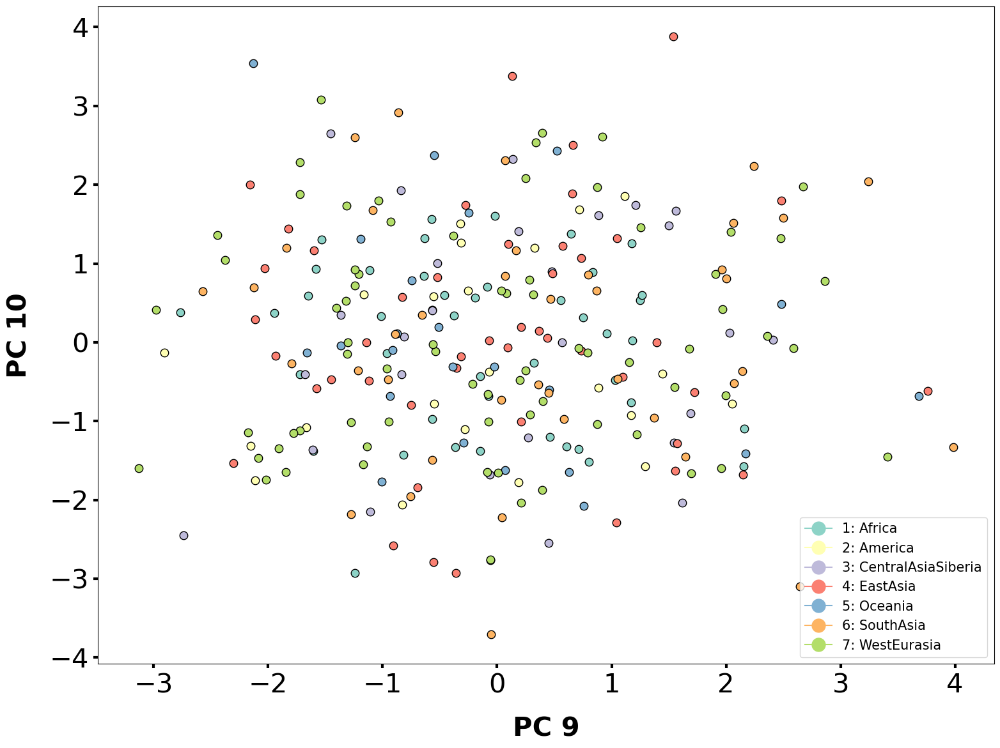

In [75]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.709493     4.616401     3.311394   
America            F        Colombia    -4.139471     0.249102    -4.890480   
WestEurasia        M          France    -0.108159    -3.658278     0.835052   
WestEurasia        M  Italy(Bergamo)     0.288656    -3.296369     1.629714   
Africa             M           Congo     9.418528     1.873549    -2.430562   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.505509    -0.153816    -4.605054   
Oceania            M       Australia     1.065919     6.576702     5.682091   
Oceania            U       Australia    -0.925270     5.736379     4.360503   
America            F          Mexico    -3.992794     0.324264    -4.696945   
Africa             M           Sudan     7.798048   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


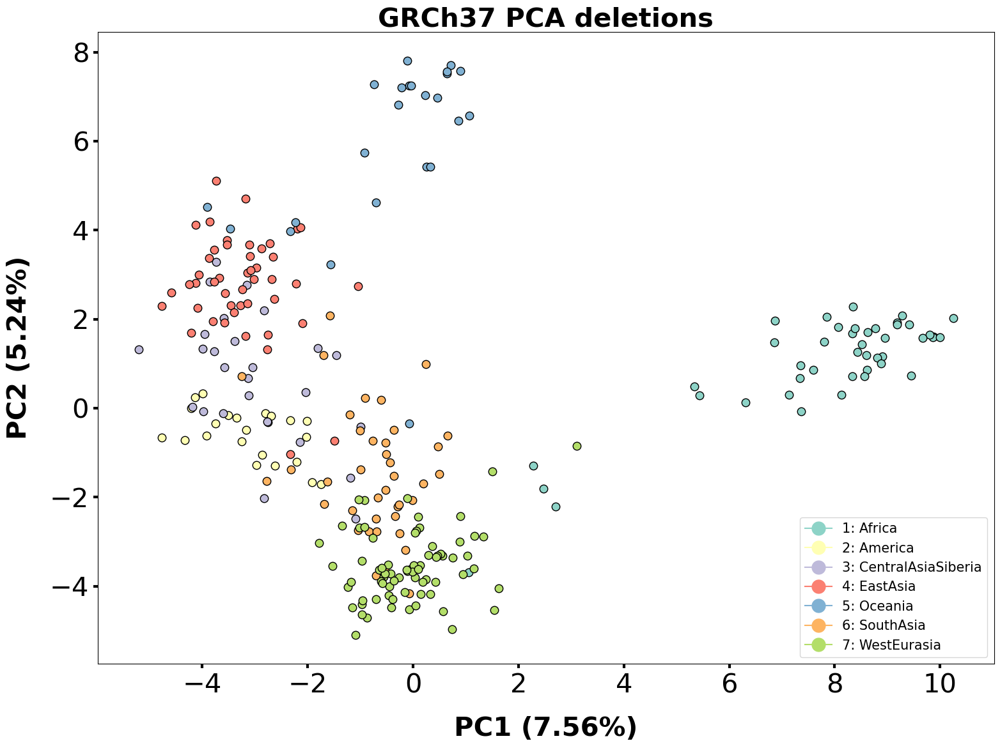

In [76]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.56%)', label_vertical='PC2 (5.24%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions", size=30, fontweight="bold")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.709493     4.616401     3.311394   
America            F        Colombia    -4.139471     0.249102    -4.890480   
WestEurasia        M          France    -0.108159    -3.658278     0.835052   
WestEurasia        M  Italy(Bergamo)     0.288656    -3.296369     1.629714   
Africa             M           Congo     9.418528     1.873549    -2.430562   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.505509    -0.153816    -4.605054   
Oceania            M       Australia     1.065919     6.576702     5.682091   
Oceania            U       Australia    -0.925270     5.736379     4.360503   
America            F          Mexico    -3.992794     0.324264    -4.696945   
Africa             M           Sudan     7.798048   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


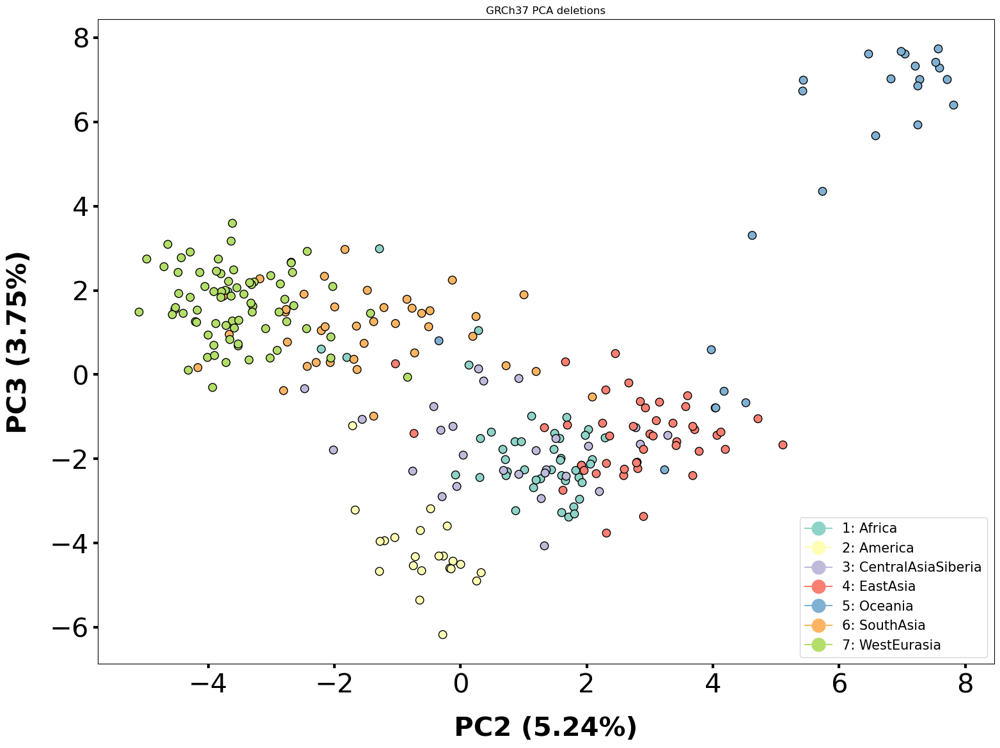

In [77]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (5.24%)', label_vertical='PC3 (3.75%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.709493     4.616401     3.311394   
America            F        Colombia    -4.139471     0.249102    -4.890480   
WestEurasia        M          France    -0.108159    -3.658278     0.835052   
WestEurasia        M  Italy(Bergamo)     0.288656    -3.296369     1.629714   
Africa             M           Congo     9.418528     1.873549    -2.430562   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.505509    -0.153816    -4.605054   
Oceania            M       Australia     1.065919     6.576702     5.682091   
Oceania            U       Australia    -0.925270     5.736379     4.360503   
America            F          Mexico    -3.992794     0.324264    -4.696945   
Africa             M           Sudan     7.798048   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


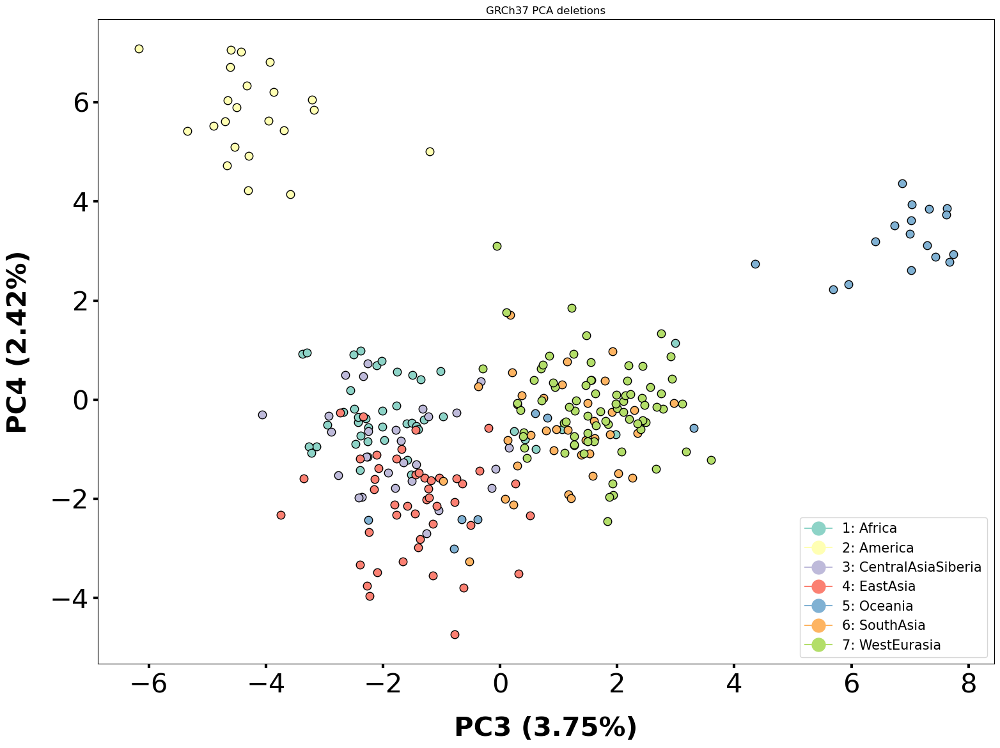

In [78]:
plot_scatter_cluster(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (3.75%)', label_vertical='PC4 (2.42%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc34.png', transparent=True)

<h1> Duplications

In [79]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


,243,346,394,1505,2574,3037,3300,4225,4963,5529,6214,6536
Sample_ID,,,,,,,,,,,,
LP6005441-DNA_A03,3.0,4.833333,8.000000,2.0,4.0,9.0,5.000000,2.142857,7.0,4.0,3.0,8.0
LP6005441-DNA_A04,4.0,5.333333,10.000000,2.0,2.0,5.0,6.500000,4.666667,9.0,6.0,2.0,8.0
LP6005441-DNA_A05,3.5,4.166667,7.000000,2.0,2.0,7.0,4.500000,6.500000,10.0,6.0,3.0,5.0
LP6005441-DNA_A06,4.0,4.083333,6.000000,2.0,2.0,10.0,4.250000,4.666667,8.0,6.0,3.0,6.5
LP6005441-DNA_A08,5.0,4.153846,3.000000,3.0,2.0,12.0,7.000000,5.333333,7.0,7.0,3.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,4.0,4.555556,8.500000,2.0,2.0,4.5,5.666667,3.333333,8.0,5.0,2.0,7.0
SS6004477,3.0,5.333333,9.666667,2.0,2.0,12.0,3.500000,3.800000,9.0,4.0,3.0,6.0
SS6004478,4.0,5.500000,8.000000,2.0,2.0,9.0,4.500000,4.000000,9.0,5.0,3.0,7.5


In [80]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [81]:
#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2','component_3','component_4','component_5','component_6','component_7','component_8','component_9','component_10'],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.486793,-1.565714,-2.298543,1.430004,0.898305,-0.467850,1.954925,1.197595,-0.372893,1.171704
LP6005441-DNA_A04,F,America,Colombia,-4.380584,-1.262330,1.214021,1.654802,1.524851,0.654268,-0.916807,0.522912,0.597001,-0.538149
LP6005441-DNA_A05,M,WestEurasia,France,-1.770245,1.665836,2.104567,-0.334488,-1.624537,0.040501,-0.642974,-0.261258,-0.104226,0.340959
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),1.106233,1.188542,-0.691248,0.752859,-0.740719,-1.059542,-0.162886,-0.396584,-0.151749,-0.006425
LP6005441-DNA_A08,M,Africa,Congo,3.907493,4.422033,-0.897468,-1.823470,1.463696,-0.936267,-0.889521,-0.773201,0.464895,-0.062351
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-4.728096,-0.629771,-0.517627,0.350477,0.977384,-0.133733,0.390643,-0.257164,0.437640,-0.310099
SS6004477,M,Oceania,Australia,2.484188,-2.842811,0.600621,0.458222,-1.564624,-0.085428,1.496585,0.884932,-0.449416,-0.375875
SS6004478,U,Oceania,Australia,-0.304444,-0.709211,-0.293514,1.466138,-0.611197,0.190798,0.383849,0.836798,0.174691,-0.818096
SS6004479,F,America,Mexico,-1.323457,-0.813234,-1.701333,1.328415,0.890999,0.305985,0.444480,0.214854,-0.106605,-0.615352


            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.486793    -1.565714    -2.298543   
America            F        Colombia    -4.380584    -1.262330     1.214021   
WestEurasia        M          France    -1.770245     1.665836     2.104567   
WestEurasia        M  Italy(Bergamo)     1.106233     1.188542    -0.691248   
Africa             M           Congo     3.907493     4.422033    -0.897468   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -4.728096    -0.629771    -0.517627   
Oceania            M       Australia     2.484188    -2.842811     0.600621   
Oceania            U       Australia    -0.304444    -0.709211    -0.293514   
America            F          Mexico    -1.323457    -0.813234    -1.701333   
Africa             M           Sudan    -1.684064   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.486793    -1.565714    -2.298543   
America            F        Colombia    -4.380584    -1.262330     1.214021   
WestEurasia        M          France    -1.770245     1.665836     2.104567   
WestEurasia        M  Italy(Bergamo)     1.106233     1.188542    -0.691248   
Africa             M           Congo     3.907493     4.422033    -0.897468   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -4.728096    -0.629771    -0.517627   
Oceania            M       Australia     2.484188    -2.842811     0.600621   
Oceania            U       Australia    -0.304444    -0.709211    -0.293514   
America            F          Mexico    -1.323457    -0.813234    -1.701333   
Africa             M           Sudan    -1.684064   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv

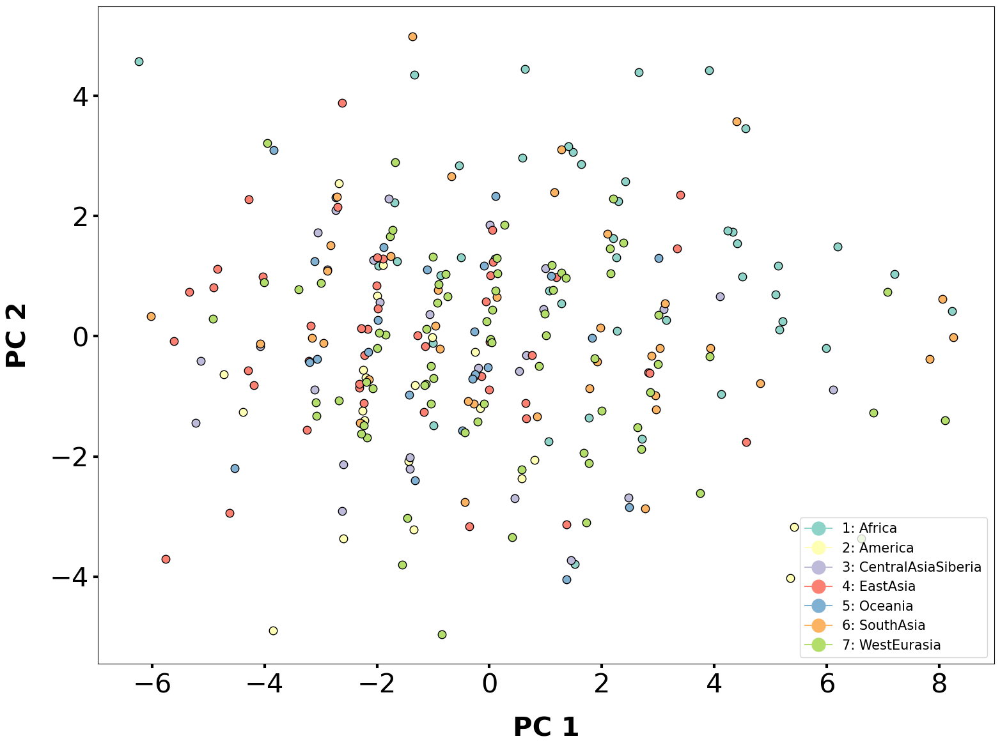

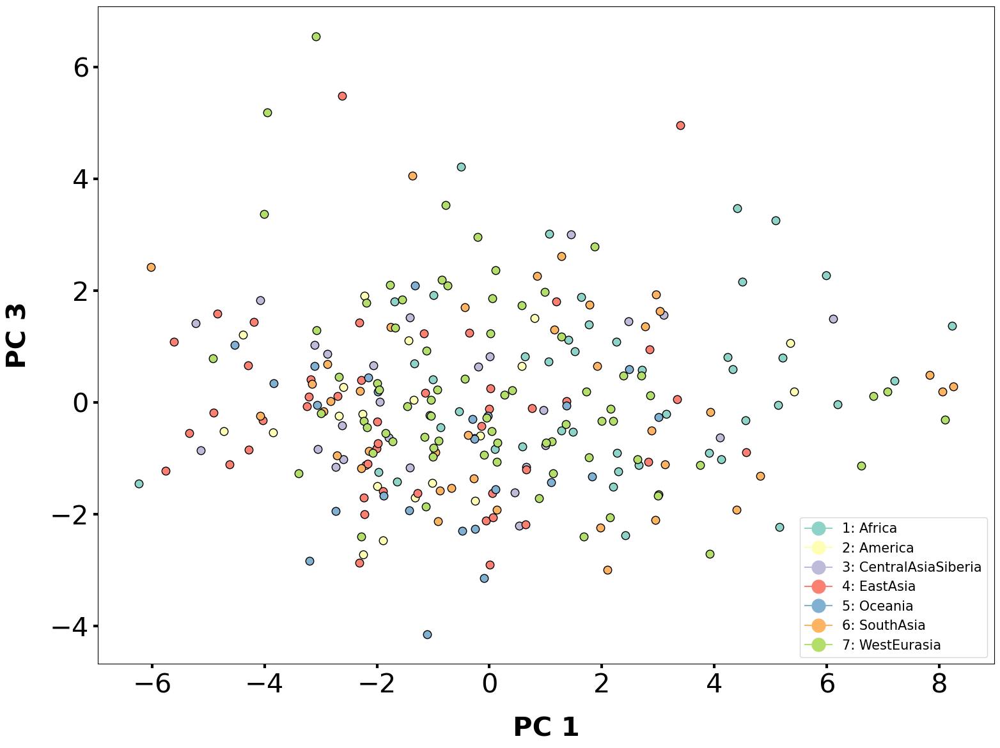

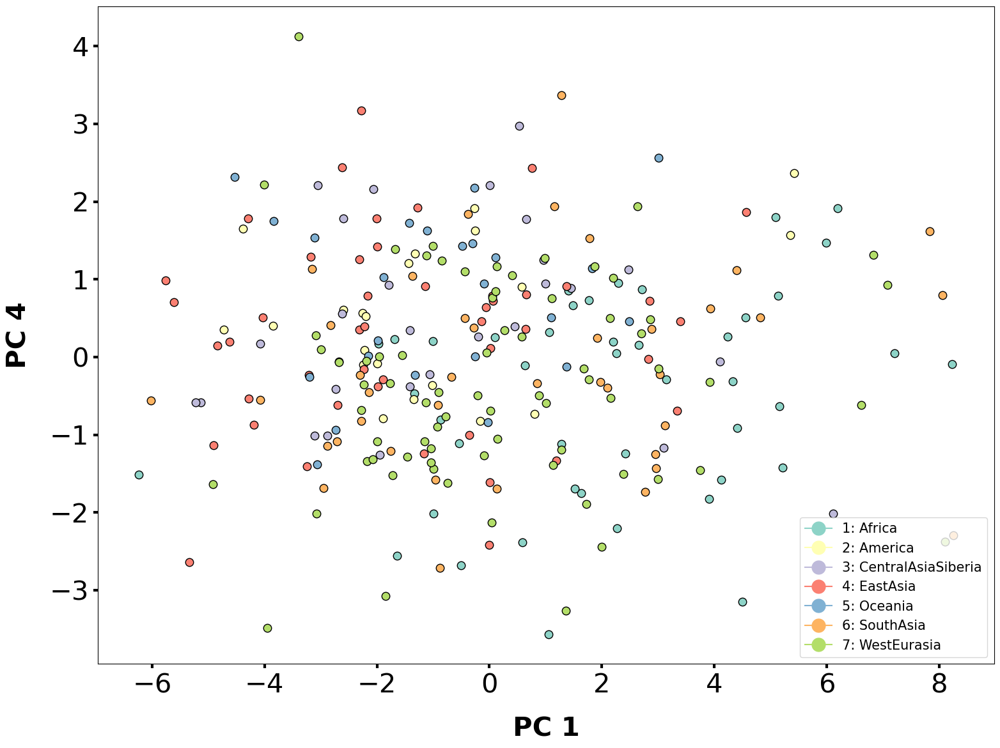

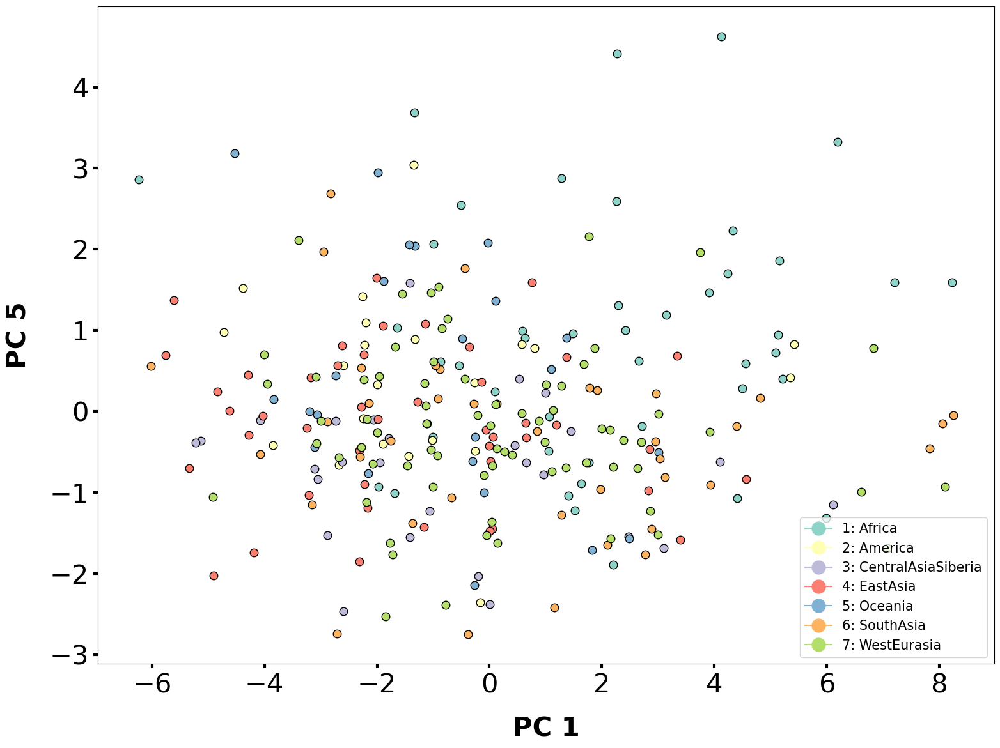

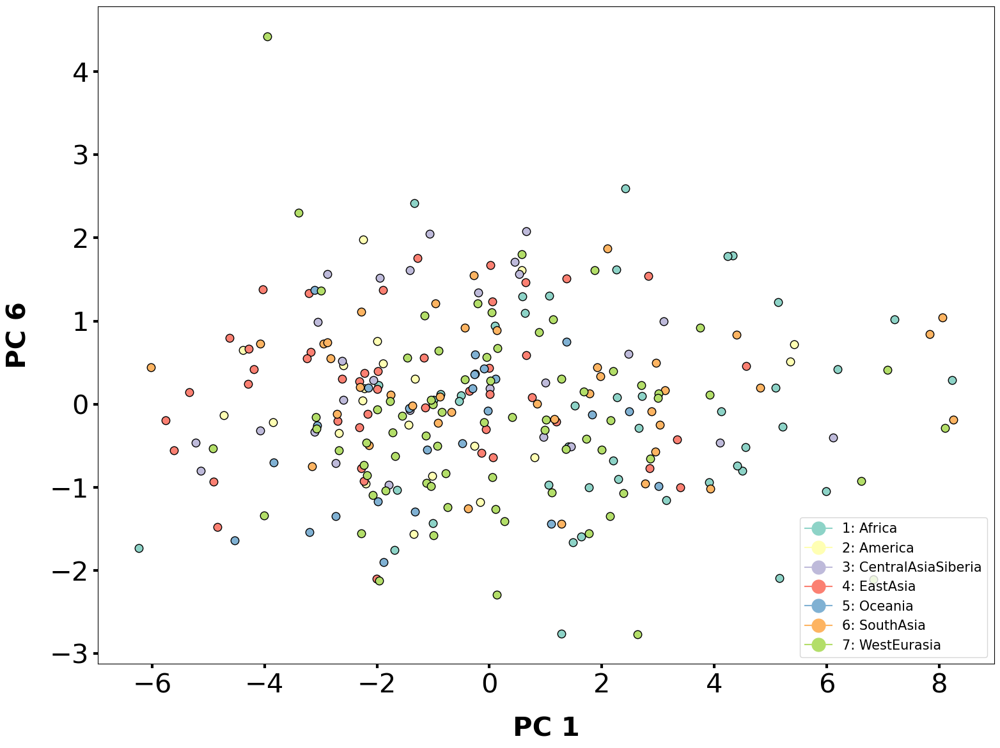

...

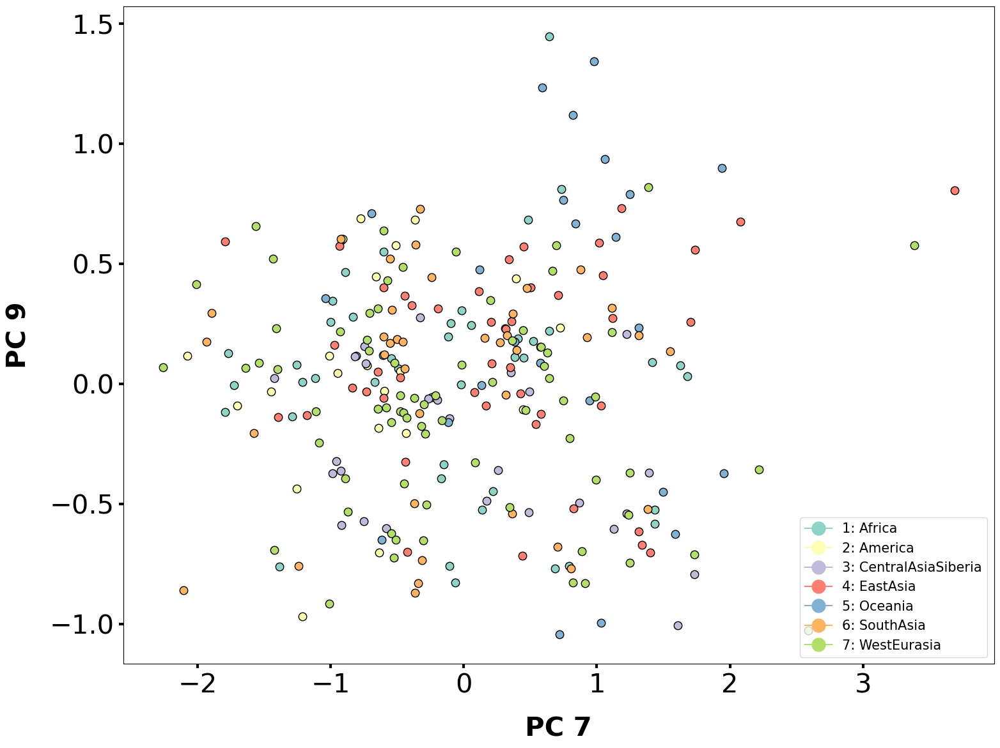

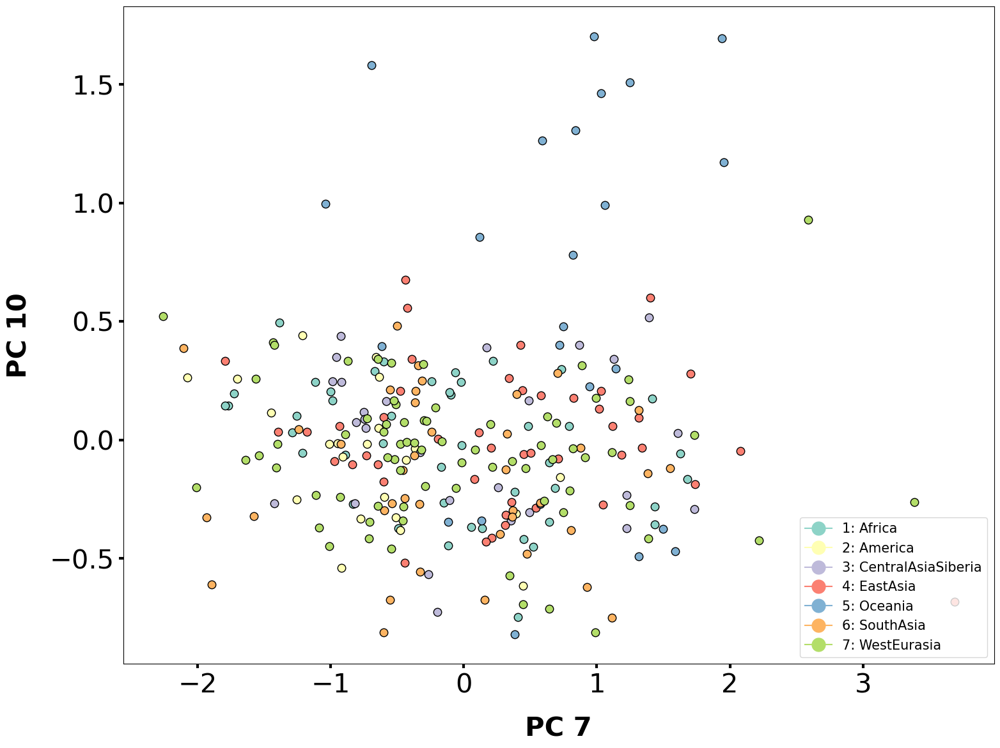

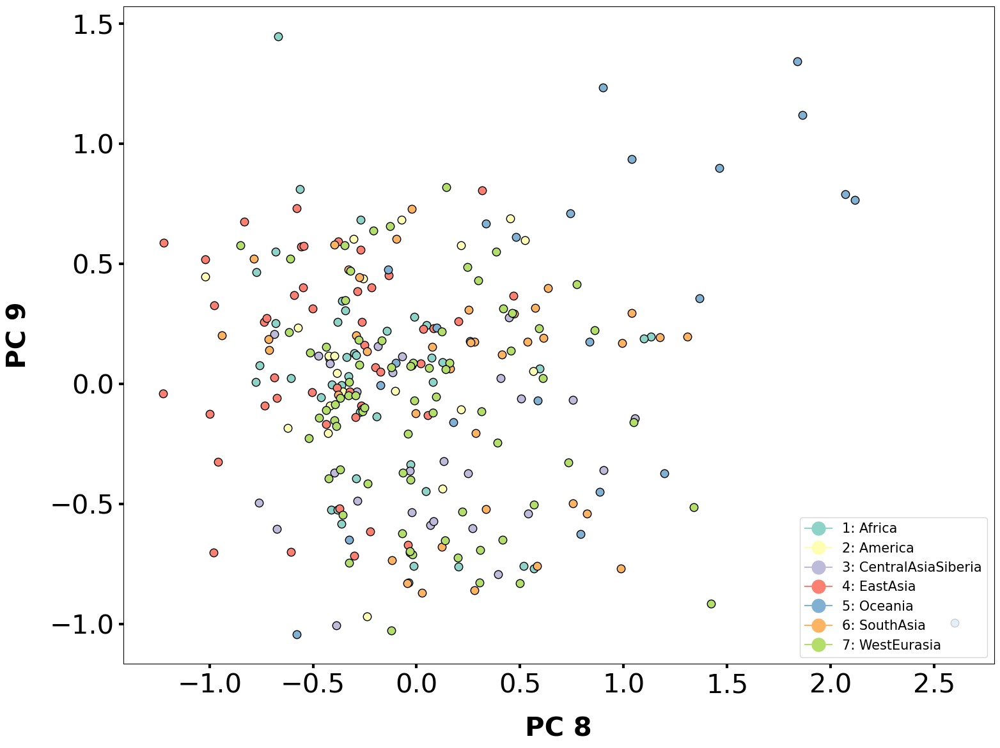

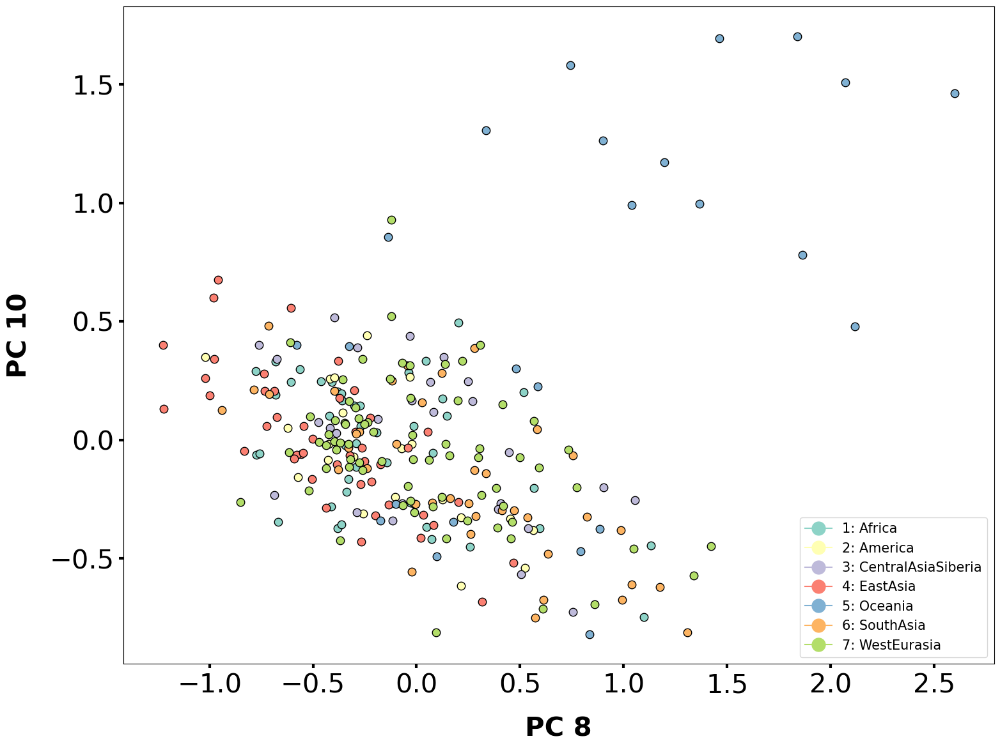

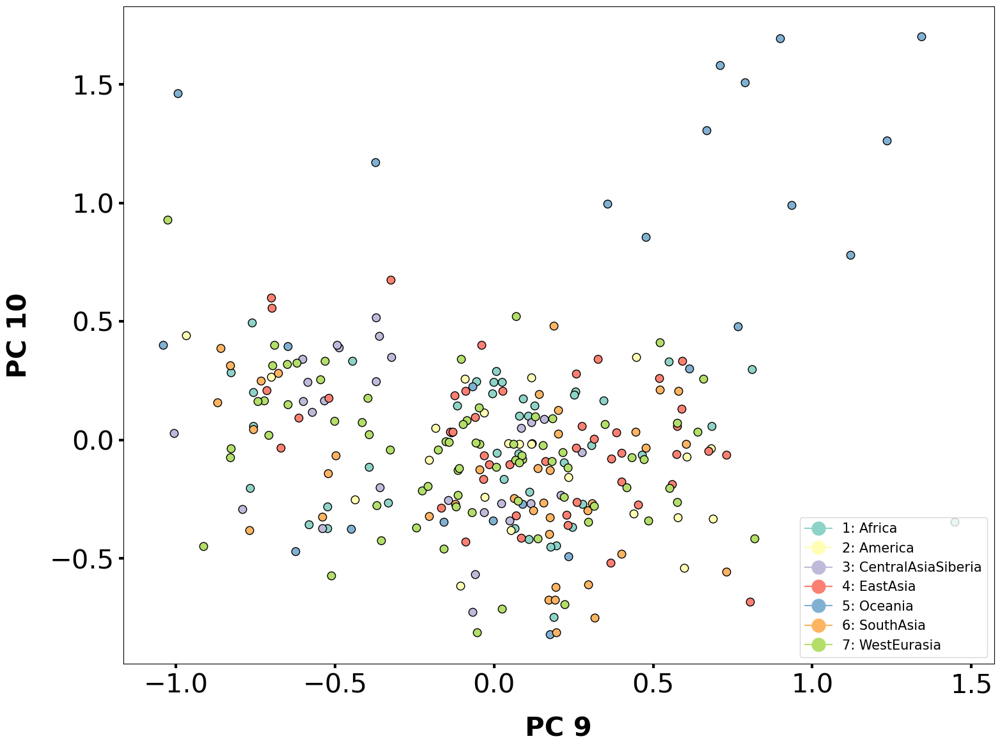

In [82]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [83]:
pca.explained_variance_ratio_

array([0.4192086 , 0.15544064, 0.12199463, 0.08480669, 0.07492974,
       0.04997158, 0.04765764, 0.01720603, 0.01070346, 0.00826276])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.486793    -1.565714    -2.298543   
America            F        Colombia    -4.380584    -1.262330     1.214021   
WestEurasia        M          France    -1.770245     1.665836     2.104567   
WestEurasia        M  Italy(Bergamo)     1.106233     1.188542    -0.691248   
Africa             M           Congo     3.907493     4.422033    -0.897468   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -4.728096    -0.629771    -0.517627   
Oceania            M       Australia     2.484188    -2.842811     0.600621   
Oceania            U       Australia    -0.304444    -0.709211    -0.293514   
America            F          Mexico    -1.323457    -0.813234    -1.701333   
Africa             M           Sudan    -1.684064   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


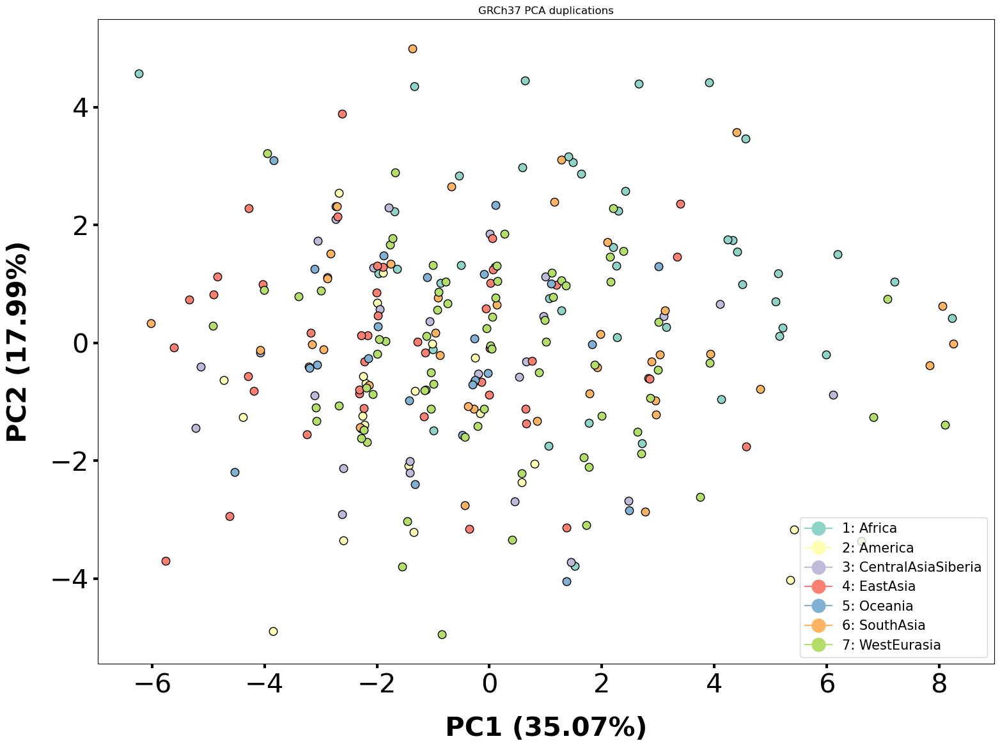

In [84]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (35.07%)', label_vertical='PC2 (17.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.486793    -1.565714    -2.298543   
America            F        Colombia    -4.380584    -1.262330     1.214021   
WestEurasia        M          France    -1.770245     1.665836     2.104567   
WestEurasia        M  Italy(Bergamo)     1.106233     1.188542    -0.691248   
Africa             M           Congo     3.907493     4.422033    -0.897468   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -4.728096    -0.629771    -0.517627   
Oceania            M       Australia     2.484188    -2.842811     0.600621   
Oceania            U       Australia    -0.304444    -0.709211    -0.293514   
America            F          Mexico    -1.323457    -0.813234    -1.701333   
Africa             M           Sudan    -1.684064   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


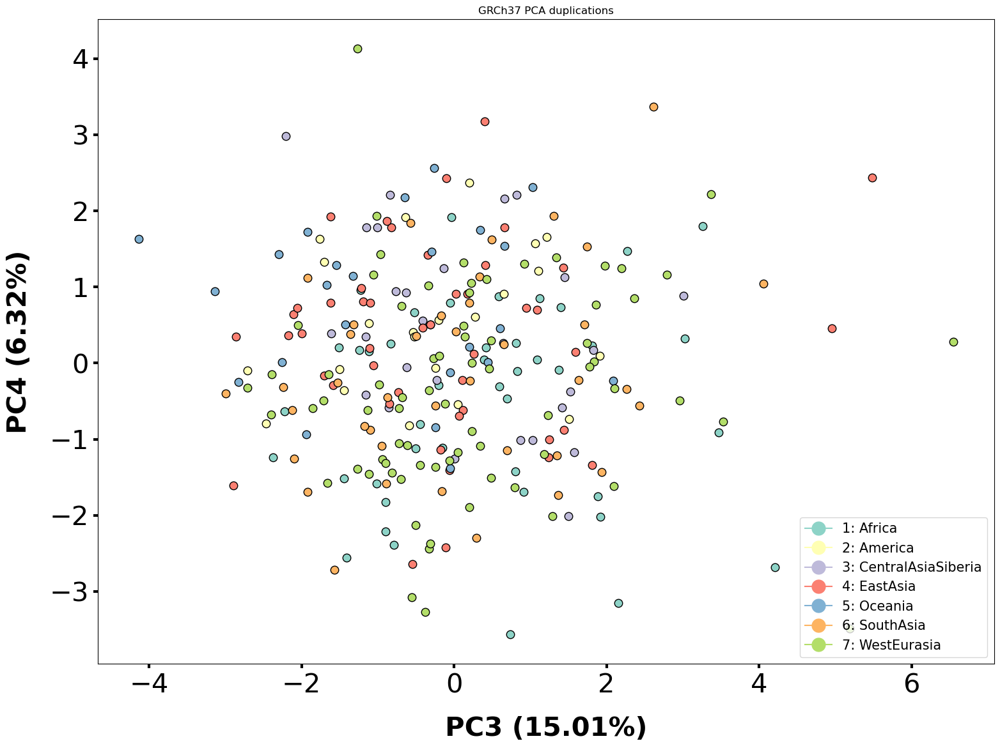

In [85]:
plot_scatter_cluster(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (15.01%)', label_vertical='PC4 (6.32%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc34.png', transparent=True)

<h1> Dmean results 

In [86]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,0.00515,0.07196,0.14110,0.19841,0.07856,0.00792,0.06681,0.13595,0.20356,0.07341,...,0.06914,0.27037,0.00660,0.07988,0.33951,0.06254,0.14903,0.27697,0.19048,0.08648
1,0.02771,0.06253,0.00371,0.03004,0.05145,0.00442,0.09023,0.03142,0.00233,0.07915,...,0.05881,0.09256,0.01108,0.05811,0.03375,0.04774,0.00071,0.08148,0.03446,0.04703
2,0.03152,0.08061,0.04202,0.06141,0.08287,0.03291,0.11213,0.07354,0.09293,0.11439,...,0.03859,0.01919,0.00227,0.11351,0.01940,0.04086,0.07492,0.02146,0.09432,0.11578
3,0.00958,0.00680,0.03044,0.00680,0.00680,0.02032,0.01638,0.02086,0.01638,0.01638,...,0.03724,0.00000,0.00000,0.02712,0.03724,0.03724,0.01012,0.00000,0.02712,0.02712
4,0.00557,0.00043,0.01014,0.01015,0.05082,0.00982,0.00514,0.00456,0.01572,0.04525,...,0.00970,0.01058,0.05039,0.00939,0.02028,0.04068,0.00031,0.06097,0.01997,0.04100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8645,0.00020,0.13314,0.05123,0.05123,0.05123,0.05123,0.13333,0.05103,0.05103,0.05103,...,0.18436,0.18436,0.18436,0.18436,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
8646,0.00558,0.41209,0.17371,0.81536,0.03152,0.11510,0.40651,0.17929,0.80978,0.03711,...,0.58580,0.40327,0.44362,0.52719,0.98907,0.14218,0.05861,0.84688,0.93046,0.08357
8647,0.00173,0.40824,0.17756,0.81151,0.03538,0.11895,0.40651,0.17929,0.80978,0.03711,...,0.58580,0.40327,0.44362,0.52719,0.98907,0.14218,0.05861,0.84688,0.93046,0.08357
8648,0.02072,0.02525,0.02072,0.02072,0.04649,0.02072,0.00453,0.00000,0.00000,0.06721,...,0.00453,0.00453,0.07175,0.00453,0.00000,0.06721,0.00000,0.06721,0.00000,0.06721


In [87]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

,0,1,2,3,4,5,6,7,8,9,...,8640,8641,8642,8643,8644,8645,8646,8647,8648,8649
WestEurasia-SouthAsia,0.9536,0.3647,0.4249,0.5550,0.7460,0.1153,0.3022,0.7336,0.7783,0.1808,...,0.6029,0.2908,0.4722,0.8282,0.5424,0.8509,0.9733,0.9912,1.0000,0.8376
WestEurasia-Africa,0.3510,0.0017,0.0216,1.0000,1.0000,1.0000,1.0000,0.3747,0.3788,0.7932,...,0.1531,0.2847,0.1446,0.2916,0.5283,0.1020,0.0153,0.0150,0.6108,0.2494
WestEurasia-CentralAsiaSiberia,0.1263,0.9201,0.3040,0.1166,0.7105,0.2646,0.2604,0.2697,0.2779,0.9121,...,0.7705,0.3767,0.9029,0.7750,0.8024,0.5922,0.3545,0.3483,1.0000,0.4331
WestEurasia-Oceania,0.0802,0.3772,0.2126,1.0000,0.8097,1.0000,0.2415,0.2451,1.0000,0.4118,...,0.7658,0.5875,0.3467,0.5704,0.8189,0.8171,0.0002,0.0003,1.0000,0.0006
WestEurasia-America,0.4620,0.0727,0.0575,1.0000,0.2322,1.0000,0.2262,1.0000,0.2294,0.4042,...,0.3773,0.5342,0.2076,0.0614,0.8207,1.0000,0.8692,0.8525,0.4098,0.3087
WestEurasia-EastAsia,0.9192,0.8685,0.4792,0.3004,0.5556,0.1393,0.0533,0.3798,0.7586,0.7725,...,0.1037,0.4229,0.6101,0.8591,0.5212,0.5233,0.4647,0.4450,1.0000,0.9218
SouthAsia-Africa,0.4275,0.0001,0.0067,0.2191,0.6118,0.2183,0.3617,0.8642,1.0000,0.2469,...,0.4707,1.0000,0.4745,0.4717,1.0000,0.2099,0.0449,0.0455,1.0000,0.2545
SouthAsia-CentralAsiaSiberia,0.1451,0.5371,0.1037,0.4867,0.8556,0.8492,0.6572,0.6499,0.7519,0.1503,...,1.0000,1.0000,0.4875,0.8095,1.0000,1.0000,0.4117,0.4042,1.0000,0.5944
SouthAsia-Oceania,0.1131,0.9632,0.1169,0.5165,0.7568,0.7589,0.6666,0.9099,1.0000,0.1395,...,1.0000,0.3850,1.0000,1.0000,1.0000,1.0000,0.0009,0.0010,1.0000,0.0010
SouthAsia-America,0.5432,0.0402,0.0205,0.7681,0.6157,0.7692,0.6771,0.7869,0.7716,0.1298,...,1.0000,1.0000,0.0756,0.0788,1.0000,1.0000,0.8435,0.8382,0.3600,0.3029


In [88]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


,20,31,36,37,51,55,80,109,162,175,...,8570,8572,8586,8617,8628,8629,8630,8646,8647,8649
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,True,False,True,False,...,False,False,True,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,True,False,False,False,False,False,True,True,True,False,...,True,False,False,False,False,False,False,True,True,True
WestEurasia-America,False,False,True,True,False,False,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,True,False,False,True,False,...,False,False,True,False,False,False,False,False,False,False
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,True,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,False,False,False,True,False,True,False,...,True,True,False,False,False,False,False,True,True,True
SouthAsia-America,False,False,True,False,False,False,False,False,True,True,...,False,False,False,True,True,False,True,False,False,False


In [89]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



,0,1,2,10,20,31,33,36,37,38,...,8630,8632,8634,8636,8642,8643,8645,8646,8647,8649
WestEurasia-SouthAsia,False,False,False,False,True,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,True,True,False,True,False,True,False,False,True,...,False,False,True,True,False,False,False,True,True,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,False,False,True,False,False,...,False,False,False,True,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,False,False,False,True,True,True
WestEurasia-America,False,False,False,True,False,True,False,True,True,False,...,True,True,False,True,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
SouthAsia-Africa,False,True,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,True,True,False
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
SouthAsia-America,False,True,True,True,False,False,False,True,True,False,...,True,True,False,False,False,False,False,False,False,False


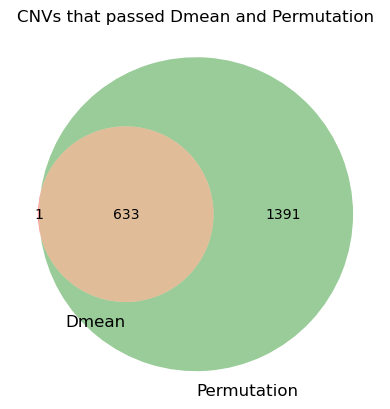

In [90]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [91]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
20,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
31,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
36,False,False,False,False,True,False,False,False,False,True,...,True,False,True,False,True,False,True,True,False,True
37,False,False,False,False,True,False,False,False,False,False,...,False,False,True,False,False,True,False,True,False,True
51,False,False,False,False,False,True,False,False,False,False,...,False,False,True,True,False,False,True,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8629,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False
8630,False,False,False,False,False,False,False,False,False,True,...,False,False,True,False,False,False,False,True,False,False
8646,False,False,False,True,False,False,False,False,True,False,...,True,False,False,True,True,False,False,True,True,False
8647,False,False,False,True,False,False,False,False,True,False,...,True,False,False,True,True,False,False,True,True,False


<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [92]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
543,True,True,False,False,False,False,True,False,True,True,...,True,True,True,True,False,False,False,False,False,False
914,False,False,False,False,True,False,False,False,True,True,...,False,False,False,True,False,False,True,False,True,True
1193,True,True,True,False,False,False,False,False,False,False,...,False,False,True,True,True,False,False,True,True,False
1325,False,False,False,False,False,False,False,False,True,False,...,True,True,True,True,False,False,False,False,False,False
1492,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
1604,False,True,False,False,False,False,False,False,False,False,...,False,True,True,True,True,True,True,True,False,True
2216,True,True,False,False,False,True,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False
2241,True,False,True,True,True,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,True
2738,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2986,True,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


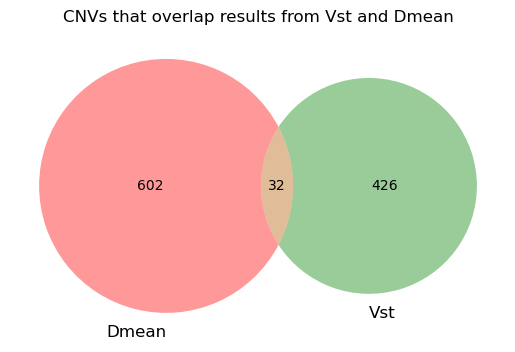

In [93]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [94]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)

NameError: name 'candidates574' is not defined

<h1> Gene anotation of CNVs 

In [95]:
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
28,chr1,8360201,8360201,0.32161,0.19993,0.00000,0.00000,0.00000,0.00000,0.00956,...,0.20261,0.15949,0.19242,0.22741,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
29,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.00196,0.01078,0.02217,0.00500,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253
38,chr1,13219701,13219701,0.12209,0.03194,0.00035,0.01716,0.00461,0.03145,0.25941,...,0.03815,0.09418,0.06579,0.10193,0.01286,0.00234,0.02582,0.00593,0.00135,0.01395
43,chr1,16150401,16150401,0.00136,0.01265,0.02431,0.16701,0.07339,0.06031,0.02660,...,0.00097,0.28660,0.13966,0.10306,0.33966,0.18954,0.15444,0.02655,0.02565,0.00035
66,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.06285,0.38182,0.00497,0.01891,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7758,chr9,131183401,131183401,0.08988,0.07894,0.00025,0.00037,0.11241,0.33761,0.00243,...,0.07787,0.07081,0.00267,0.11757,0.00107,0.11122,0.32242,0.09506,0.30464,0.08488
7762,chr9,134074401,134074401,0.24892,0.00807,0.00186,0.06963,0.01037,0.02543,0.17743,...,0.00206,0.03050,0.02831,0.05123,0.04679,0.01793,0.03793,0.09668,0.14224,0.00107
7765,chr9,136453701,136453701,0.26558,0.21090,0.25679,0.01753,0.19511,0.06390,0.00612,...,0.00577,0.10340,0.00031,0.03493,0.13056,0.00897,0.07348,0.08675,0.01170,0.03321
7766,chr9,137097701,137097701,0.00357,0.09135,0.09335,0.42325,0.21517,0.18116,0.05796,...,0.00000,0.20208,0.03162,0.01917,0.19304,0.03398,0.02388,0.08993,0.08715,0.00077


In [96]:
from pyranges import PyRanges

In [97]:
## Anotation data
grch37_genes = pd.read_csv('../annotation_files/grch37-genes.csv')
grch37_genes.columns = ['#"bin"', 'name', 'Chromosome', 'strand', 'Start', 'End', 'cdsStart',
       'cdsEnd', 'exonCount', 'exonStarts', 'exonEnds', 'score', 'name2',
       'cdsStartStat', 'cdsEndStat', 'exonFrames'] 

grch37_genes = grch37_genes[['Chromosome', 'Start', 'End', 'name2']]
grch37_genes = PyRanges(grch37_genes)
grch37_genes

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,name2
0,chr1,66998949,67214670,SGIP1
1,chr1,66999065,67210057,SGIP1
2,chr1,66999257,67156201,SGIP1
3,chr1,66999257,67157665,SGIP1
4,chr1,66999257,67214670,SGIP1
...,...,...,...,...
104285,chrY,59330366,59343488,IL9R
104286,chrY,59330376,59343488,IL9R
104287,chrY,59336888,59354907,ENSG00000292369
104288,chrY,59347293,59349508,WASIR1


In [98]:
vst_dt_filtered_ranges = PyRanges(vst_dt_filtered)
vst_dt_filtered_ranges 

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,chr1,8360201,8360201,0.32161,0.19993,0.00000,0.00000,0.00000,0.00000,0.00956,...,0.20261,0.15949,0.19242,0.22741,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.00196,0.01078,0.02217,0.00500,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253
2,chr1,13219701,13219701,0.12209,0.03194,0.00035,0.01716,0.00461,0.03145,0.25941,...,0.03815,0.09418,0.06579,0.10193,0.01286,0.00234,0.02582,0.00593,0.00135,0.01395
3,chr1,16150401,16150401,0.00136,0.01265,0.02431,0.16701,0.07339,0.06031,0.02660,...,0.00097,0.28660,0.13966,0.10306,0.33966,0.18954,0.15444,0.02655,0.02565,0.00035
4,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.06285,0.38182,0.00497,0.01891,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,chr22,39293301,39293301,0.79872,0.21876,0.00037,0.15121,0.16303,0.24633,0.29789,...,0.20995,0.01058,0.01174,0.00082,0.14179,0.15438,0.24094,0.00000,0.01678,0.02157
454,chr22,42896701,42896701,0.18207,0.02746,0.00827,0.13234,0.02026,0.00017,0.05992,...,0.05171,0.16670,0.07966,0.01526,0.08633,0.00066,0.00706,0.11711,0.08531,0.01150
455,chr22,44917501,44917501,0.00260,0.01378,0.00696,0.17243,0.05642,0.13559,0.00448,...,0.03694,0.26626,0.11463,0.20213,0.11790,0.02389,0.08107,0.06154,0.01698,0.01648
456,chr22,45554601,45554601,0.17283,0.10223,0.00602,0.18116,0.09725,0.24952,0.04690,...,0.07260,0.04904,0.00103,0.03762,0.15497,0.06489,0.21187,0.04682,0.00692,0.04789


In [99]:
#Genes
grch37_coordinates_genes = vst_dt_filtered_ranges.nearest(grch37_genes)
grch37_coordinates_genes = grch37_coordinates_genes.as_df()
grch37_coordinates_genes = grch37_coordinates_genes[grch37_coordinates_genes['Distance'] <1 ]
grch37_coordinates_genes

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
0,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253,9788983,9884023,CLSTN1,0
1,chr1,24377601,24377601,0.00769,0.11063,0.25742,0.66625,0.13524,0.15024,0.10092,...,0.14607,0.03831,0.01258,0.30917,0.20186,0.00683,24367324,24413289,ENSG00000225315,0
2,chr1,62622101,62622101,0.32773,0.08017,0.00258,0.00814,0.01360,0.05126,0.12431,...,0.00756,0.03158,0.06778,0.03698,0.05290,0.02089,62208148,62629592,PATJ,0
3,chr1,72755201,72755201,0.14884,0.08983,0.18860,0.20407,0.07712,0.15207,0.05135,...,0.04891,0.04727,0.00713,0.10883,0.04313,0.01572,72748935,73138076,ENSG00000286863,0
4,chr1,85974801,85974801,0.00074,0.19351,0.00378,0.03099,0.01608,0.03054,0.25727,...,0.01970,0.00643,0.01794,0.00346,0.00001,0.00305,85784163,86044046,DDAH1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,chr22,32520401,32520401,0.00202,0.21871,0.03295,0.03442,0.01595,0.00853,0.22568,...,0.00001,0.00396,0.00810,0.00433,0.00718,0.00074,32517963,32529456,AP1B1P1,0
447,chr22,33780301,33780301,0.00088,0.00007,0.00157,0.01483,0.20102,0.06097,0.00045,...,0.00756,0.22117,0.07344,0.20391,0.06657,0.04060,33558211,34157463,LARGE1,0
448,chr22,39293301,39293301,0.79872,0.21876,0.00037,0.15121,0.16303,0.24633,0.29789,...,0.14179,0.15438,0.24094,0.00000,0.01678,0.02157,39282841,39299799,ENSG00000288106,0
449,chr22,42896701,42896701,0.18207,0.02746,0.00827,0.13234,0.02026,0.00017,0.05992,...,0.08633,0.00066,0.00706,0.11711,0.08531,0.01150,42896558,42908568,SERHL,0


In [100]:
grch37_coordinates_genes.sort_values(by='Africa-America', ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
253,chr9,130098601,130098601,0.88525,0.45552,0.18065,0.05556,0.22673,0.13627,0.16364,...,0.05067,0.00765,0.00024,0.08431,0.04026,0.00442,130025940,130155826,GARNL3,0
13,chr1,206277501,206277501,0.80295,0.31489,0.58207,0.12245,0.27561,0.28373,0.36067,...,0.27750,0.23262,0.07071,0.02158,0.06844,0.03512,206238881,206288197,RHEX,0
448,chr22,39293301,39293301,0.79872,0.21876,0.00037,0.15121,0.16303,0.24633,0.29789,...,0.14179,0.15438,0.24094,0.00000,0.01678,0.02157,39282841,39299799,ENSG00000288106,0
333,chr13,78997501,78997501,0.79422,0.32345,0.26178,0.00842,0.05936,0.07881,0.23399,...,0.16610,0.08772,0.04905,0.02242,0.03407,0.00490,78493823,79158297,OBI1-AS1,0
347,chr14,41608701,41608701,0.60642,0.31708,0.25872,0.46622,0.06048,0.13612,0.19917,...,0.02250,0.12260,0.01926,0.26152,0.07080,0.04394,41423897,41618512,LINC02315,0
144,chr5,170129701,170129701,0.56242,0.55944,0.44008,0.32426,0.24169,0.00405,0.00219,...,0.01051,0.07106,0.34872,0.02162,0.21551,0.16078,169780490,170162939,KCNIP1,0
112,chr4,93832601,93832601,0.54804,0.28976,0.26369,0.50293,0.21014,0.09287,0.15490,...,0.03610,0.01360,0.06641,0.09794,0.17580,0.02073,93225116,94695717,GRID2,0
295,chr11,69982301,69982301,0.50884,0.12315,0.08826,0.00287,0.16850,0.04767,0.16307,...,0.05253,0.01124,0.00442,0.11285,0.02416,0.02923,69832012,70035636,ANO1,0
6,chr1,108732201,108732201,0.49746,0.07909,0.21636,0.24122,0.31489,0.07253,0.24543,...,0.00022,0.01597,0.03194,0.01169,0.02962,0.08178,108676664,108742965,SLC25A24,0
248,chr9,17290001,17290001,0.49430,0.55462,0.64100,0.49353,0.53730,0.34350,0.01249,...,0.01990,0.03715,0.11252,0.00159,0.04568,0.04886,17135037,17503921,CNTLN,0


In [104]:
#America

In [105]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-America'] > 0.2 and row['Africa-Oceania'] < 0.1 and row['Africa-CentralAsiaSiberia'] < 0.1):
        ls.append(row)
pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
0,chr1,9846201,9846201,0.27586,0.04239,0.04981,0.02736,0.09376,0.01048,0.12424,...,0.01737,0.01359,0.01488,0.04846,0.00036,0.05253,9788983,9884023,CLSTN1,0
2,chr1,62622101,62622101,0.32773,0.08017,0.00258,0.00814,0.01360,0.05126,0.12431,...,0.00756,0.03158,0.06778,0.03698,0.05290,0.02089,62208148,62629592,PATJ,0
16,chr1,240391301,240391301,0.25645,0.00001,0.00703,0.00888,0.02818,0.01451,0.37332,...,0.02891,0.00651,0.00163,0.06752,0.03539,0.00123,240255182,240638487,FMN2,0
40,chr2,43869901,43869901,0.24469,0.06119,0.15626,0.04969,0.00041,0.00041,0.07480,...,0.01620,0.16912,0.13807,0.05830,0.03723,0.00148,43864398,43995126,PLEKHH2,0
41,chr2,51926401,51926401,0.32880,0.01535,0.01175,0.00814,0.04905,0.02817,0.25038,...,0.00000,0.06704,0.04058,0.04815,0.02636,0.00139,51259738,52635055,ENSG00000231918,0
44,chr2,100099401,100099401,0.26414,0.00681,0.00118,0.02759,0.00004,0.00001,0.24479,...,0.01809,0.00167,0.00130,0.03126,0.02344,0.00001,100016937,100106435,REV1,0
48,chr2,125427001,125427001,0.25789,0.02328,0.01075,0.00000,0.01376,0.00670,0.19432,...,0.00756,0.00016,0.00001,0.00993,0.00442,0.00024,124782863,125678796,CNTNAP5,0
56,chr2,215726401,215726401,0.30497,0.03657,0.10427,0.06986,0.16264,0.14438,0.14394,...,0.00206,0.01314,0.01329,0.02167,0.01829,0.00002,215674932,215828299,SNHG31,0
91,chr3,196934401,196934401,0.24491,0.05663,0.07311,0.00287,0.26436,0.14388,0.09484,...,0.04321,0.10318,0.05410,0.19499,0.09321,0.00182,196769430,197025483,DLG1,0
197,chr7,48653101,48653101,0.32161,0.02328,0.00000,0.00000,0.00000,0.02916,0.20373,...,0.00000,0.00000,0.02995,0.00000,0.01938,0.02706,48211054,48687093,ABCA13,0


In [103]:
## OCEANIA

In [123]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Oceania-WestEurasia'] > 0.2 and row['Africa-WestEurasia'] < 0.1 and row['SouthAsia-WestEurasia'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
9,chr1,169217201,169217201,0.08719,0.00035,0.00302,0.09185,0.01536,0.06235,0.12241,...,0.10795,0.03969,0.10033,0.21302,0.20956,0.02072,169101768,169337184,NME7,0
15,chr1,234318601,234318601,0.31556,0.40731,0.64847,0.46805,0.10283,0.02291,0.00786,...,0.05678,0.37447,0.57831,0.16913,0.34348,0.04026,234040421,234460257,SLC35F3,0
45,chr2,109289001,109289001,0.02676,0.04590,0.06814,0.13969,0.07955,0.06521,0.00191,...,0.01580,0.22029,0.19514,0.27484,0.21175,0.00046,109150126,109300802,LIMS1,0
50,chr2,153459901,153459901,0.01402,0.01596,0.06911,0.35225,0.02210,0.01205,0.00000,...,0.12796,0.01601,0.02975,0.22486,0.25929,0.00148,153191687,153506340,FMNL2,0
53,chr2,164601201,164601201,0.01562,0.01779,0.03162,0.35432,0.00179,0.02981,0.00000,...,0.18639,0.01999,0.00015,0.32270,0.20344,0.01797,164600422,164770131,ENSG00000237844,0
79,chr3,22236301,22236301,0.03706,0.02841,0.02346,0.08678,0.00076,0.04688,0.00206,...,0.20629,0.03869,0.00573,0.08138,0.24934,0.06856,21459910,22414684,ZNF385D,0
105,chr4,6652901,6652901,0.07637,0.01091,0.08649,0.12735,0.02158,0.02773,0.02670,...,0.00264,0.02643,0.18240,0.04755,0.23600,0.08936,6650421,6675623,LINC02482,0
109,chr4,31003501,31003501,0.00000,0.09729,0.16008,0.33578,0.06576,0.00942,0.07243,...,0.03332,0.04200,0.14739,0.14823,0.30193,0.03817,30721990,31148427,PCDH7,0
135,chr5,79824801,79824801,0.00769,0.00877,0.01175,0.23243,0.00345,0.01430,0.00000,...,0.25901,0.01404,0.00000,0.18515,0.28587,0.01686,79783918,79838382,FAM151B,0
137,chr5,90498501,90498501,0.05970,0.07051,0.05583,0.12050,0.10016,0.05145,0.00023,...,0.30433,0.00855,0.00001,0.39485,0.26333,0.00731,90447054,90610219,LUCAT1,0


In [106]:
## West 


In [107]:
## WEST EURASIA

In [109]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-WestEurasia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-CentralAsiaSiberia'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
12,chr1,204369601,204369601,0.01348,0.08639,0.01915,0.06389,0.07605,0.21406,0.03769,...,0.01637,0.01895,0.11438,0.00002,0.09707,0.08747,204346977,204404974,PPP1R15B-AS1,0
52,chr2,160028301,160028301,0.18598,0.05279,0.01767,0.00041,0.00558,0.29955,0.08384,...,0.01134,0.00288,0.20076,0.00269,0.31108,0.22292,159825151,160089170,TANC1,0
176,chr6,136845301,136845301,0.16450,0.06237,0.17760,0.09984,0.26414,0.27889,0.05549,...,0.00812,0.03004,0.01674,0.07316,0.04598,0.00319,136663418,136871957,MAP7,0
254,chr9,131183401,131183401,0.08988,0.07894,0.00025,0.00037,0.11241,0.33761,0.00243,...,0.00107,0.11122,0.32242,0.09506,0.30464,0.08488,131174044,131199630,CERCAM,0
264,chr10,7064801,7064801,0.04455,0.02427,0.01051,0.00120,0.13469,0.22868,0.12172,...,0.01681,0.07790,0.17248,0.13846,0.19420,0.03014,7050414,7160394,ENSG00000287277,0
265,chr10,24375401,24375401,0.02197,0.04628,0.00467,0.00018,0.18029,0.30480,0.10420,...,0.01028,0.23856,0.35564,0.15479,0.23869,0.04021,23983674,24836772,KIAA1217,0
291,chr11,31389301,31389301,0.19231,0.04027,0.00204,0.02758,0.24262,0.23998,0.09521,...,0.05164,0.27825,0.26567,0.12446,0.12321,0.00490,30885149,31391286,DCDC1,0


In [127]:
## Central ASia siberia

In [110]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-CentralAsiaSiberia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1 and row['EastAsia-Oceania'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
199,chr7,65585201,65585201,0.03077,0.23656,0.09417,0.05556,0.10716,0.06076,0.15183,...,0.02625,0.00345,0.00105,0.03959,0.01346,0.00770,65552747,65617264,ENSG00000249319,0
416,chr19,35660001,35660001,0.00000,0.22763,0.18184,0.06946,0.00705,0.00567,0.19795,...,0.03063,0.13940,0.17116,0.04013,0.04490,0.00008,35645637,35660784,FXYD5,0
446,chr22,32520401,32520401,0.00202,0.21871,0.03295,0.03442,0.01595,0.00853,0.22568,...,0.00001,0.00396,0.00810,0.00433,0.00718,0.00074,32517963,32529456,AP1B1P1,0


In [134]:
# Easst asia

In [112]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-EastAsia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1):
        ls.append(row)

d= pd.DataFrame(ls)

In [115]:
d['America-EastAsia']

225    0.21007
335    0.12236
348    0.16803
408    0.30801
417    0.32020
Name: America-EastAsia, dtype: float64

In [116]:
#south asia


In [117]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-SouthAsia'] > 0.2 and row['Africa-Oceania']  < 0.1 and row['Africa-America'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
225,chr8,3995301,3995301,0.00017,0.21613,0.21751,0.00011,0.31830,0.31294,0.24954,...,0.18982,0.01238,0.00688,0.30383,0.26737,0.0013,2792882,4852436,CSMD1,0
447,chr22,33780301,33780301,0.00088,0.00007,0.00157,0.01483,0.20102,0.06097,0.00045,...,0.00756,0.22117,0.07344,0.20391,0.06657,0.0406,33558211,34157463,LARGE1,0


In [118]:
# Africa

In [123]:
ls = []
for index,row in grch37_coordinates_genes.iterrows():
    if (row['Africa-SouthAsia'] > 0.2 and row['Oceania-WestEurasia']  < 0.1 and row['America-WestEurasia'] < 0.1 and row['EastAsia-Oceania'] < 0.1 and row['Oceania-SouthAsia'] < 0.1):
        ls.append(row)

pd.DataFrame(ls)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
5,chr1,94285701,94285701,0.43120,0.41269,0.44266,0.33411,0.28246,0.17574,0.00006,...,0.01751,0.03487,0.05454,0.00215,0.00852,0.00344,94027347,94312706,BCAR3,0
36,chr2,9736101,9736101,0.23176,0.25604,0.28542,0.24209,0.20191,0.15663,0.00000,...,0.00756,0.02204,0.04149,0.03698,0.04062,0.00777,9724095,9771126,YWHAQ,0
49,chr2,132003001,132003001,0.28578,0.31341,0.29336,0.27395,0.31224,0.30628,0.00000,...,0.00374,0.00232,0.00026,0.00028,0.00466,0.00376,131862925,132111282,PLEKHB2,0
54,chr2,167152301,167152301,0.16383,0.18268,0.23101,0.17181,0.21641,0.26832,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,166813910,167209440,SCN1A-AS1,0
83,chr3,131707801,131707801,0.43992,0.27069,0.33479,0.23153,0.21055,0.14726,0.02674,...,0.01518,0.00916,0.02240,0.00053,0.00080,0.00273,131252405,131756654,CPNE4,0
118,chr4,173423801,173423801,0.21632,0.13255,0.29738,0.22616,0.24244,0.13874,0.06406,...,0.00000,0.02842,0.06204,0.02018,0.04062,0.03101,172734554,173962710,GALNTL6,0
119,chr4,186440201,186440201,0.31296,0.54446,0.47694,0.52436,0.40312,0.45248,0.14031,...,0.07159,0.00512,0.00000,0.08489,0.03615,0.00389,186421813,186456661,PDLIM3,0
165,chr6,31871101,31871101,0.46477,0.25715,0.32217,0.42792,0.30091,0.30360,0.07387,...,0.02549,0.00025,0.00023,0.02971,0.02754,0.00000,31865561,31913449,C2,0
174,chr6,126173601,126173601,0.24344,0.19432,0.05877,0.03216,0.21822,0.04210,0.01970,...,0.00189,0.07719,0.00091,0.09603,0.00016,0.07317,126102306,126252257,NCOA7,0
176,chr6,136845301,136845301,0.16450,0.06237,0.17760,0.09984,0.26414,0.27889,0.05549,...,0.00812,0.03004,0.01674,0.07316,0.04598,0.00319,136663418,136871957,MAP7,0
